# Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from IPython.core.display import HTML, display
import lxml
from lxml import html
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from pprint import pprint

# Helper Functions

In [ ]:
def func_remove_outlier(df: pd.Series):
  q1 = df.quantile(0.25)
  q3 = df.quantile(0.75)
  iqr = q3 - q1
  df_filtered = df.apply(lambda row: max(min(q3, row), q1))
  return df_filtered

In [ ]:
# plot wrapper
def fig_editor(fig, figsize = 15, title_size = 15, tick_size = 15, label_size = 15):
  # set figure size
  fig.figure.set_size_inches(w = (figsize, figsize))

  # set title size
  fig.title.set_fontsize(fontsize = title_size)

  # set label size
  fig.xaxis.get_label().get_text().set_fontsize(fontsize = label_size)
  fig.yaxis.get_label().set_fontsize(fontsize = label_size)

  # set tick size
  fig.tick_params(axis = 'both', which = 'major', labelsize = tick_size)

In [ ]:
from typing import Union
def standard_scaler(df: Union[pd.Series, pd.DataFrame]) -> pd.Series:
  ss = StandardScaler()
  return ss.fit_transform(pd.DataFrame(df))

In [ ]:
def hypotest_apply(df: pd.DataFrame):
  test_df = df.copy()
  feature_name = df.columns.drop('adjusted_price')[0]
  test_df[f'remove_out_{feature_name}'] = func_remove_outlier(test_df[feature_name])
  test_df[f'ss_{feature_name}'] = standard_scaler(test_df[feature_name])
  test_df[f'{feature_name}_squared'] = test_df[feature_name] ** 2
  test_df[f'{feature_name}_log'] = np.log(test_df[feature_name])
  test_df[f'{feature_name}_sqrt'] = np.sqrt(test_df[feature_name])
  display(test_df.corr().loc['adjusted_price'])
  fig = sns.heatmap(pd.DataFrame(test_df.corr().loc['adjusted_price']), annot = True)
  plt.show()
  return test_df

In [ ]:
def corr_after_hypo(test_df: pd.DataFrame, cat_df: pd.DataFrame):
  test_df = pd.concat((test_df, cat_df), axis = 1)
  cat_name = cat_df.columns[0]
  display(test_df.groupby(cat_name).corr()['adjusted_price'])

# EDA

## Load Dataset

In [ ]:
dataset_path = "Combined_df.csv"
df = pd.read_csv(dataset_path, index_col = 'Unnamed: 0')
df = df[np.isfinite(df['adjusted_price'])]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182977 entries, 0 to 182976
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   month                          182977 non-null  object 
 1   town                           182977 non-null  object 
 2   flat_type                      182977 non-null  object 
 3   block                          182977 non-null  object 
 4   street_name                    182977 non-null  object 
 5   storey_range                   182977 non-null  object 
 6   floor_area_sqm                 182977 non-null  float64
 7   flat_model                     182977 non-null  object 
 8   lease_commence_date            182977 non-null  int64  
 9   remaining_lease                182977 non-null  object 
 10  resale_price                   182977 non-null  float64
 11  adjusted_price                 182977 non-null  float64
 12  distance_to_mrt                1829

In [ ]:
df.describe()

,floor_area_sqm,lease_commence_date,resale_price,adjusted_price,distance_to_mrt,distance_to_park,distance_to_sports_facilities,distance_to_primary_school,distance_to_secondary_school,distance_to_junior_college
count,182977.000000,182977.000000,1.829770e+05,1.829770e+05,182977.000000,182977.000000,182977.000000,182977.000000,182977.000000,182977.000000
mean,97.136483,1996.036999,4.990231e+05,4.452303e+05,0.572423,0.739933,0.461476,0.418026,0.528128,2.237351
std,24.029069,14.054994,1.732978e+05,1.467214e+05,0.377712,0.410342,0.323769,0.254963,0.321076,1.333132
min,31.000000,1966.000000,1.400000e+05,1.113359e+05,0.014632,0.046039,0.000395,0.042560,0.049506,0.057954
25%,82.000000,1985.000000,3.700000e+05,3.413137e+05,0.286916,0.445453,0.242515,0.238944,0.294079,1.163357
50%,93.000000,1996.000000,4.698880e+05,4.200000e+05,0.495819,0.654135,0.381374,0.366907,0.456791,1.915828
75%,112.000000,2010.000000,5.950000e+05,5.202076e+05,0.766718,0.944775,0.571495,0.533712,0.678071,3.189420
max,249.000000,2020.000000,1.588000e+06,1.258000e+06,3.524741,2.411716,3.334435,3.322520,3.606279,5.974000


In [ ]:
stratify_columns = ['town', 'flat_type', 'storey_range', 'flat_model']
df, df_test = train_test_split(df, test_size = 0.4, random_state = 42, shuffle = True)
df_val, df_test = train_test_split(df_test, test_size = 0.5, random_state = 42, shuffle = True)

In [ ]:
bool_dict = {}
for col in stratify_columns:
  diff_val_test = set(df_test[col].unique()).difference(set(df_val[col].unique()))
  diff_val_train = set(df[col].unique()).difference(set(df_val[col].unique()))
  is_col_same = len(diff_val_test) == len(diff_val_train) == 0
  bool_dict[col] = is_col_same
pprint(bool_dict)

{'flat_model': True, 'flat_type': True, 'storey_range': True, 'town': True}


In [ ]:
print(f"Train_set_size: {df.shape[0]}\n\
Validation_set_size: {df_val.shape[0]}\n\
Test_set_size: {df_test.shape[0]}")

Train_set_size: 109786
Validation_set_size: 36595
Test_set_size: 36596


## Town EDA

In [ ]:
df_town = df[['town', 'adjusted_price']]

In [ ]:
display(df_town['town'].value_counts())

,count
town,
SENGKANG,9162
PUNGGOL,8135
WOODLANDS,7709
YISHUN,7490
TAMPINES,7393
JURONG WEST,7299
BEDOK,5812
HOUGANG,5617
CHOA CHU KANG,5063


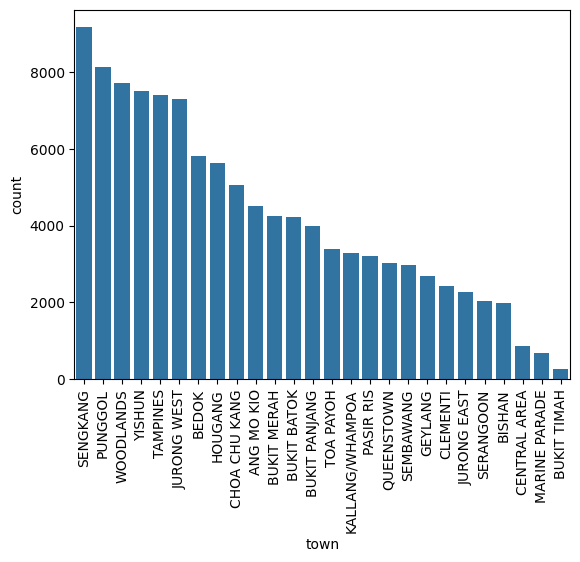

In [ ]:
sns.barplot(df_town['town'].value_counts())
plt.xticks(rotation = 90)
plt.show()

<Axes: xlabel='adjusted_price', ylabel='town'>

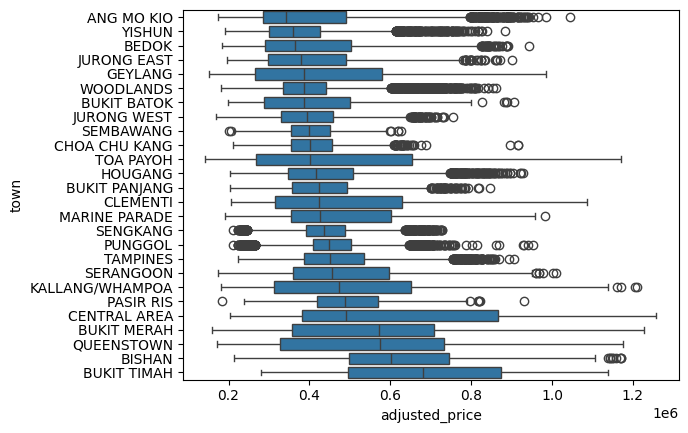

In [ ]:
group_medians = df_town.groupby(['town'])['adjusted_price'].median().sort_values(ascending=True)
sns.boxplot(data = df_town, x = 'adjusted_price', y = 'town', orient = 'h', order = group_medians.index)

<b> The medians of adjusted_price for each town is quite similar with exception to some towns such as Bukit Timah, Bishan, Bukit Merah and Queenstown. Interestingly, they all can be cactegorised under the central region
Source:https://en.wikipedia.org/wiki/Central_Region,_Singapore

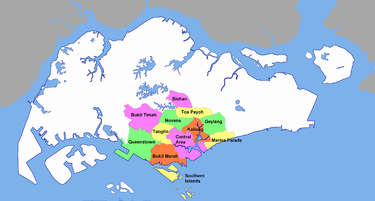

In [ ]:
cluster_size = [i for i in range(2, len(df_town['town'].unique()) + 1)]
c_score = []
for c_size in cluster_size:
  category_mean_prices = df_town.copy().groupby('town')['adjusted_price'].mean().reset_index()
  category_mean_prices.columns = ['town', 'mean_price']
  # Prepare the data for clustering (mean price for each category)
  X = category_mean_prices[['mean_price']].values

  # Perform KMeans clustering (e.g., 2 clusters in this example)
  kmeans = KMeans(n_clusters=c_size, random_state=42)
  category_mean_prices['cluster'] = kmeans.fit_predict(X)

  # Map the cluster labels to the original dataframe
  df_town_2 = df_town.copy()
  df_town_2 = df_town_2.merge(category_mean_prices[['town', 'cluster']], on='town', how='left')

  # Calculate silhouette score on continuous target values
  for i in range(5):
    df_town_3 = df_town_2.sample(10000)
    silhouette_avg = silhouette_score(df_town_3[['adjusted_price']], df_town_3['cluster'], metric='euclidean')
    c_score.append(silhouette_avg)
  print(f"Silhouette Score (n = {c_size}): {sum(c_score) / 5}")
  c_score.clear()

Silhouette Score (n = 2): 0.33589409079849164
Silhouette Score (n = 3): 0.017420564912900328
Silhouette Score (n = 4): -0.005124984986312606
Silhouette Score (n = 5): -0.0788749745039822
Silhouette Score (n = 6): -0.07904579085361749
Silhouette Score (n = 7): -0.15317906257057684
Silhouette Score (n = 8): -0.18727790682219303
Silhouette Score (n = 9): -0.1931069663502546
Silhouette Score (n = 10): -0.20552524957868093
Silhouette Score (n = 11): -0.25980144064372873
Silhouette Score (n = 12): -0.26143743682345155
Silhouette Score (n = 13): -0.26767281780460295
Silhouette Score (n = 14): -0.26794714757928445
Silhouette Score (n = 15): -0.2680065636853312
Silhouette Score (n = 16): -0.2680173356125347
Silhouette Score (n = 17): -0.2781706721883218
Silhouette Score (n = 18): -0.28073100122803335
Silhouette Score (n = 19): -0.2754989504106028
Silhouette Score (n = 20): -0.3008176097997112
Silhouette Score (n = 21): -0.300289965191891
Silhouette Score (n = 22): -0.29976051618984445
Silhouett

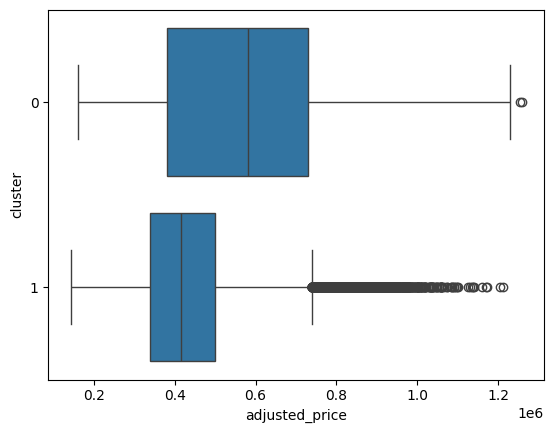

In [ ]:
  category_mean_prices = df_town.copy().groupby('town')['adjusted_price'].mean().reset_index()
  category_mean_prices.columns = ['town', 'mean_price']
  # Prepare the data for clustering (mean price for each category)
  X = category_mean_prices[['mean_price']].values

  # Perform KMeans clustering (e.g., 2 clusters in this example)
  kmeans = KMeans(n_clusters=2, random_state=42)
  category_mean_prices['cluster'] = kmeans.fit_predict(X)

  # View the resulting clusters
  #print(category_mean_prices)
  # Map the cluster labels to the original dataframe
  df_town_2 = df_town.copy()
  df_town_2 = df_town_2.merge(category_mean_prices[['town', 'cluster']], on='town', how='left')

  #print(df_town_2)
  sns.boxplot(df_town_2, x = 'adjusted_price', y = 'cluster', orient = 'h')
  plt.show()

  from sklearn.metrics import silhouette_score

  # Calculate silhouette score on continuous target values
  #df_town_3 = df_town_2.sample(10000)
  #silhouette_avg = silhouette_score(df_town_3[['adjusted_price']], df_town_3['cluster'], metric='euclidean')
  #print(f"Silhouette Score: {silhouette_avg}")
  #c_score.append(silhouette_avg)

<b>Cluster of size 2 can possibly work (in the end, not used) as found median encoding yields bette results

### Test log price

In [ ]:
df_town_log = df_town.copy()
df_town_log['adjusted_price'] = df_town_log['adjusted_price'].apply(np.log)

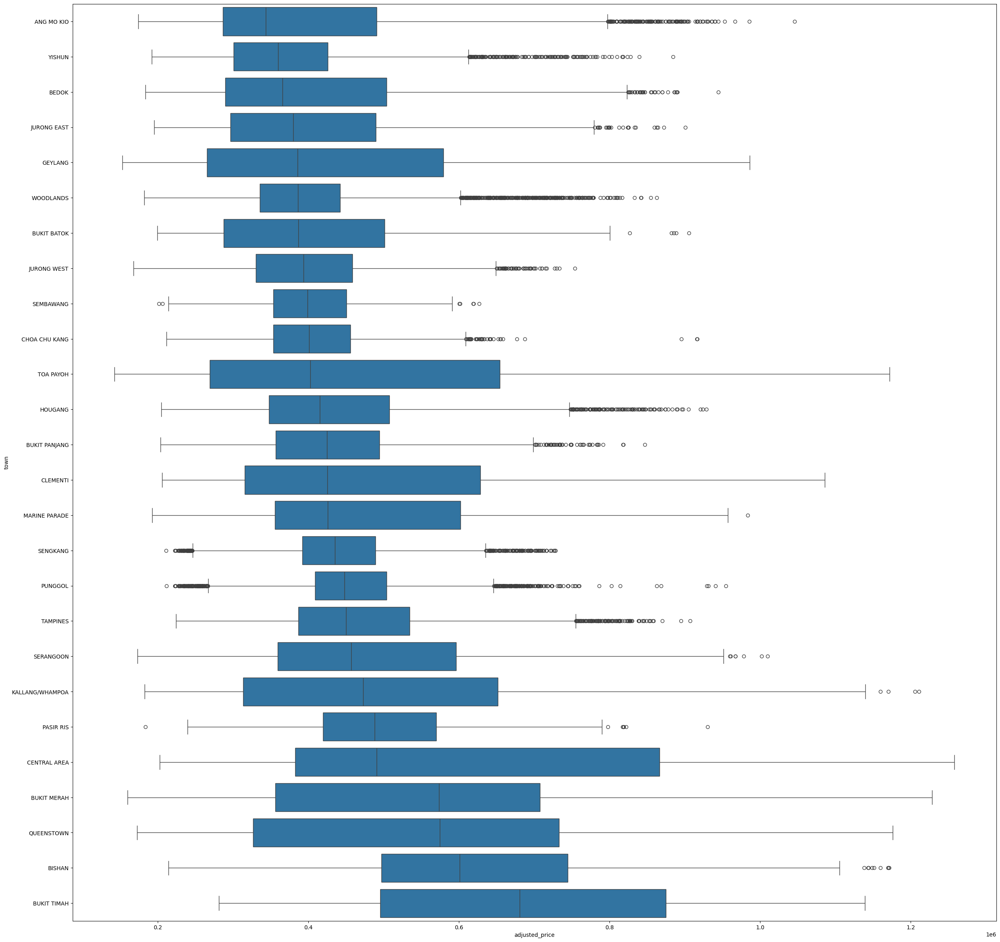

In [ ]:
# source: https://www.statology.org/seaborn-boxplot-order-x-axis/
group_means=df_town.groupby(['town'])['adjusted_price'].median().sort_values(ascending=True)
plt.figure(figsize = (30, 30))
fig = sns.boxplot(data = df_town, x = 'adjusted_price', y = 'town', orient = 'h', order = group_means.index)
plt.show()

<b> Comparing to log adjusted_price, visually there is not major differences in the distribution / splits

## Floor Area EDA

In [ ]:
df_sqm = pd.DataFrame(df[['floor_area_sqm', 'adjusted_price']])

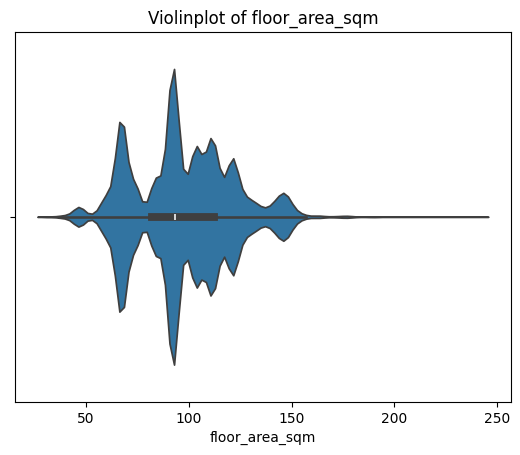

,floor_area_sqm
count,109786.000000
mean,97.158005
std,24.020096
min,31.000000
25%,82.000000
50%,93.000000
75%,112.000000
max,241.000000


In [ ]:
plt.title('Violinplot of floor_area_sqm')
sns.violinplot(data = df_sqm, x = 'floor_area_sqm')
plt.show()
display(df_sqm['floor_area_sqm'].describe())

<b> Floor area has some positive skew. This could be due to bulk majority of flats being such as 3 Room and 4 Room, and 5 Room or more premium flats skewing the distribution due to their larger floor_area

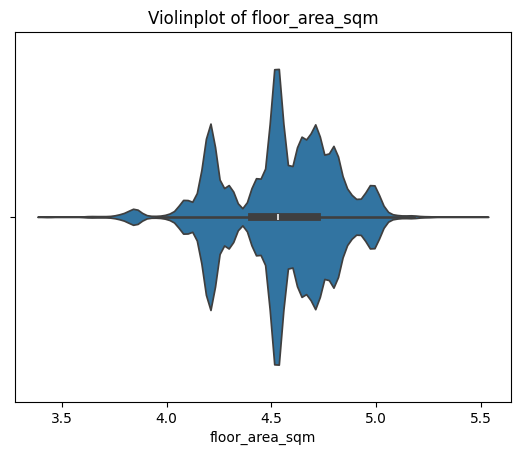

,floor_area_sqm
count,109786.000000
mean,97.158005
std,24.020096
min,31.000000
25%,82.000000
50%,93.000000
75%,112.000000
max,241.000000


In [ ]:
plt.title('Violinplot of floor_area_sqm')
sns.violinplot(x = np.log(df_sqm['floor_area_sqm']))
plt.show()
display(df_sqm['floor_area_sqm'].describe())

<Axes: title={'center': 'Plot of floor_area_sqm against adjusted_price'}, xlabel='floor_area_sqm', ylabel='adjusted_price'>

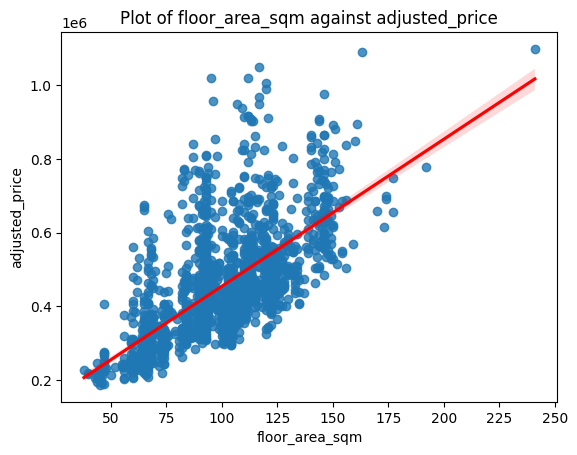

In [ ]:
plt.title('Plot of floor_area_sqm against adjusted_price')
sns.regplot(data = df_sqm.sample(2000), y = 'adjusted_price', x = 'floor_area_sqm', line_kws = {'color': 'red'})

<Axes: title={'center': 'Heatmap of correlation between floor_area_sqm and adjusted_price'}>

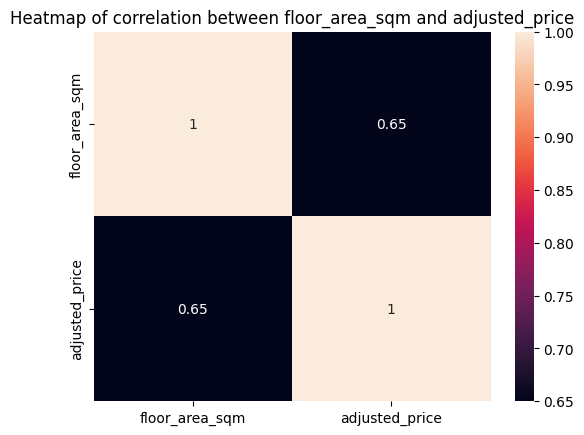

In [ ]:
plt.title('Heatmap of correlation between floor_area_sqm and adjusted_price')
sns.heatmap(df_sqm.corr(), annot = True)

<b> Floor area has a mediocre correlation with adjusted price. This still might be helpful in predictions

,adjusted_price
floor_area_sqm,0.649968
adjusted_price,1.000000
remove_out_floor_area_sqm,0.583437
ss_floor_area_sqm,0.649968
floor_area_sqm_squared,0.635915
floor_area_sqm_log,0.647271
floor_area_sqm_sqrt,0.650952


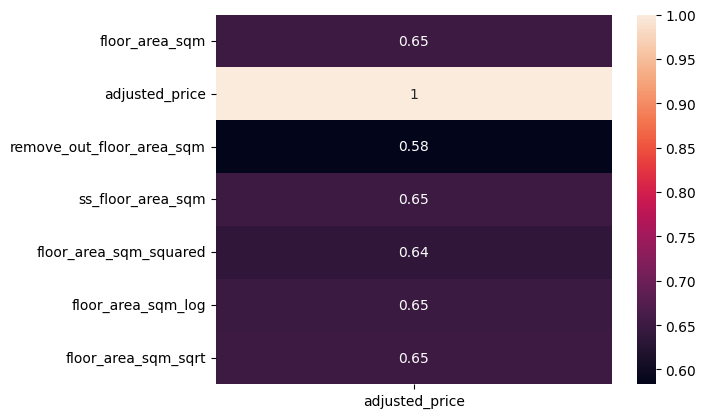

In [ ]:
def hypotest_apply(df: pd.DataFrame):
  test_df = df.copy()
  feature_name = df.columns.drop('adjusted_price')[0]
  test_df[f'remove_out_{feature_name}'] = func_remove_outlier(test_df[feature_name])
  test_df[f'ss_{feature_name}'] = standard_scaler(test_df[feature_name])
  test_df[f'{feature_name}_squared'] = test_df[feature_name] ** 2
  test_df[f'{feature_name}_log'] = np.log(test_df[feature_name])
  test_df[f'{feature_name}_sqrt'] = np.sqrt(test_df[feature_name])
  display(test_df.corr().loc['adjusted_price'])
  fig = sns.heatmap(pd.DataFrame(test_df.corr().loc['adjusted_price']), annot = True)
  plt.show()
hypotest_apply(df_sqm)

,adjusted_price
floor_area_sqm,0.649968
adjusted_price,1.000000
remove_out_floor_area_sqm,0.583437
ss_floor_area_sqm,0.649968
floor_area_sqm_squared,0.635915
floor_area_sqm_log,0.647271
floor_area_sqm_sqrt,0.650952


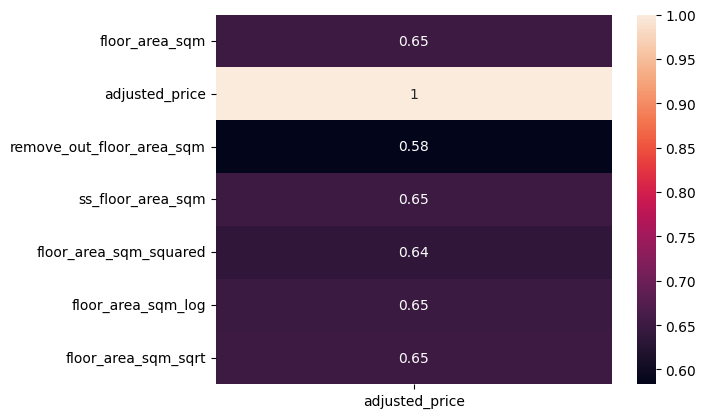

In [ ]:
def hypotest_apply(df: pd.DataFrame):
  test_df = df.copy()
  feature_name = df.columns.drop('adjusted_price')[0]
  test_df[f'remove_out_{feature_name}'] = func_remove_outlier(test_df[feature_name])
  test_df[f'ss_{feature_name}'] = standard_scaler(test_df[feature_name])
  test_df[f'{feature_name}_squared'] = test_df[feature_name] ** 2
  test_df[f'{feature_name}_log'] = np.log(test_df[feature_name])
  test_df[f'{feature_name}_sqrt'] = np.sqrt(test_df[feature_name])
  display(test_df.corr().loc['adjusted_price'])
  fig = sns.heatmap(pd.DataFrame(test_df.corr().loc['adjusted_price']), annot = True)
  plt.show()
hypotest_apply(df_sqm)

<b> Testing out various transforms do not really improve the correlation

,adjusted_price,floor_area_sqm
adjusted_price,1.000000,0.706286
floor_area_sqm,0.706286,1.000000


<Axes: >

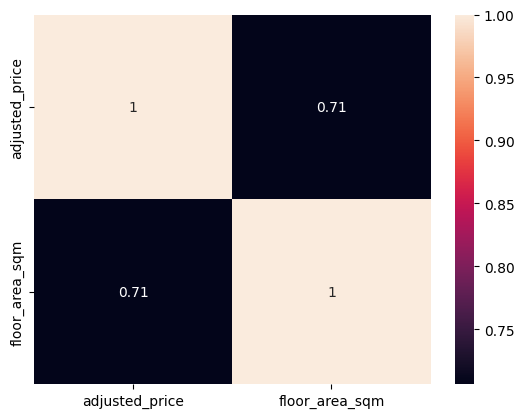

In [ ]:
df_log_price_sqm = pd.concat((np.log(df_sqm['adjusted_price']), df_sqm['floor_area_sqm']), axis = 1)
display(df_log_price_sqm.corr())
sns.heatmap(df_log_price_sqm.corr(), annot = True)

<b> Applying log transform to the adjusted_price does help improve correlation. This may be useful

## Remaining Lease EDA

In [ ]:
df_remaining_lease = pd.DataFrame(df[['remaining_lease', 'adjusted_price']])

In [ ]:
df_remaining_lease['years_left'] = df_remaining_lease['remaining_lease'].str.split().apply(lambda row: row[0]).astype(np.int16)
df_remaining_lease['months_left'] = df_remaining_lease['remaining_lease'].str.split().apply(lambda row: 0 if len(row) <= 2 else row[2]).astype(np.int16)

In [ ]:
df_remaining_lease['time_left_in_months'] = df_remaining_lease['years_left'] * 12 + df_remaining_lease['months_left']

In [ ]:
df_remaining_lease.head()

,remaining_lease,adjusted_price,years_left,months_left,time_left_in_months
121143,62 years 11 months,555035.812017,62,11,755
58782,95 years 02 months,538540.708745,95,2,1142
123320,93 years 01 month,475471.629042,93,1,1117
104054,57 years 01 month,275624.169987,57,1,685
86607,82 years 11 months,457645.184649,82,11,995


In [ ]:
df_remaining_lease['time_left_in_months'].min()

498

Text(0.5, 1.0, 'Plot of adjusted_price against time_left_in_months')

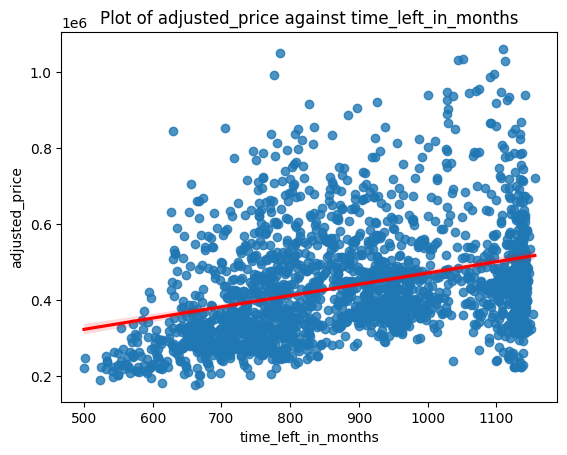

In [ ]:
sns.regplot(data = df_remaining_lease.sample(2000), y = 'adjusted_price', x = 'time_left_in_months', line_kws = {'color': 'red'})
plt.title("Plot of adjusted_price against time_left_in_months")

<Axes: >

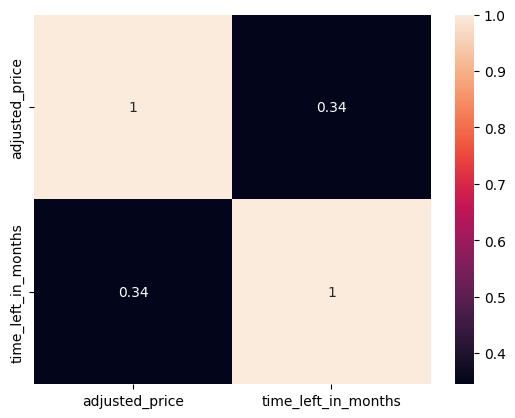

In [ ]:
sns.heatmap(data = df_remaining_lease[['adjusted_price', 'time_left_in_months']].corr(), annot = True)

<b> In general, the more time left, the more expensive the flat. This is inline with expectations. However, there seems to other more significant factors due to there seeming to have a weak linear relation with the price of the flat.</b>

In [ ]:
def filter_func(row):
  _list = [40, 50, 60, 70, 80, 90, 100]
  for i in range(1, len(_list)):
    if (row < _list[i]):
      return f'{_list[i - 1]} to {_list[i]}'


df_remaining_lease['years_left_group'] = df_remaining_lease['years_left'].apply(filter_func)

In [ ]:
df_remaining_lease['years_left_group'].value_counts()

,count
years_left_group,
60 to 70,35172
90 to 100,26995
70 to 80,25536
80 to 90,19081
50 to 60,17882
40 to 50,2265


<b> Majority of flats have more than 60 - 70 years remaining. Some possible hypothesis is the downsizing of flats with some families having their children moved out. For those in range of 90-100 years, it could be to capitalise on higher resale prices

<Axes: xlabel='adjusted_price', ylabel='years_left_group'>

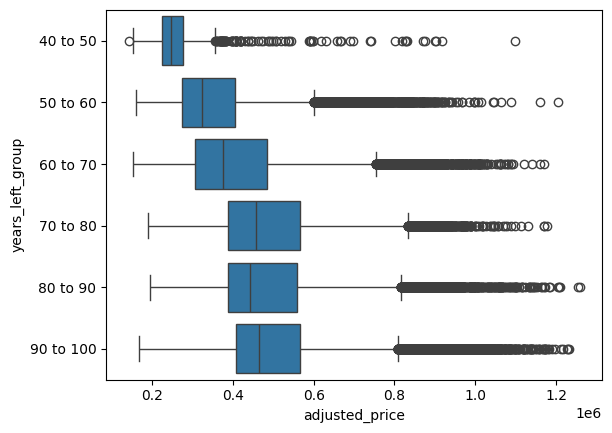

In [ ]:
group_means = df_remaining_lease.groupby(['years_left_group'])['adjusted_price'].mean().sort_values(ascending=True)
sns.boxplot(data = df_remaining_lease, x = 'adjusted_price', y = 'years_left_group', orient = 'h', order = group_means.index)

<b> After clustering into bins of 10 years, it can be seen that the price of flat is affected more if it has 70 or less years left. However, if it has 70 or more years, it is not as affected and prices lie roughly in a similar range

,adjusted_price
adjusted_price,1.000000
time_left_in_months,0.344670
remove_out_time_left_in_months,0.323631
ss_time_left_in_months,0.344670
time_left_in_months_squared,-0.010851
time_left_in_months_log,0.358270
time_left_in_months_sqrt,0.351766


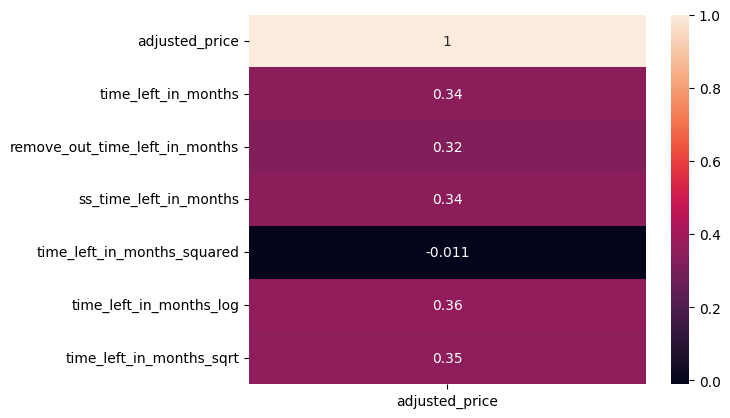

In [ ]:
hypotest_apply(df_remaining_lease[['adjusted_price', 'time_left_in_months']])

<b> Transformation on time_left_in_months do not lead to significant improvements in correlations

,adjusted_price
adjusted_price,1.000000
years_left,0.344517
remove_out_years_left,0.321238
ss_years_left,0.344517
years_left_squared,0.329096
years_left_log,0.358183
years_left_sqrt,0.351650


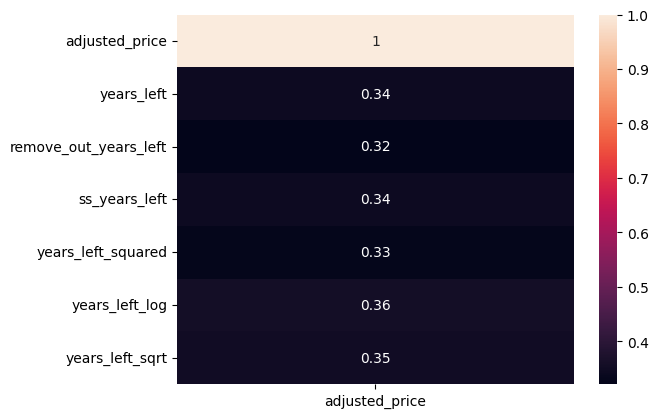

In [ ]:
hypotest_apply(df_remaining_lease[['adjusted_price', 'years_left']])

## Storey range EDA

In [ ]:
df_story_range = pd.DataFrame(df[['storey_range', 'adjusted_price']])

In [ ]:
df_story_range['storey_range'].unique()

array(['01 TO 03', '10 TO 12', '07 TO 09', '13 TO 15', '04 TO 06',
       '46 TO 48', '22 TO 24', '25 TO 27', '37 TO 39', '19 TO 21',
       '16 TO 18', '31 TO 33', '28 TO 30', '34 TO 36', '40 TO 42',
       '43 TO 45', '49 TO 51'], dtype=object)

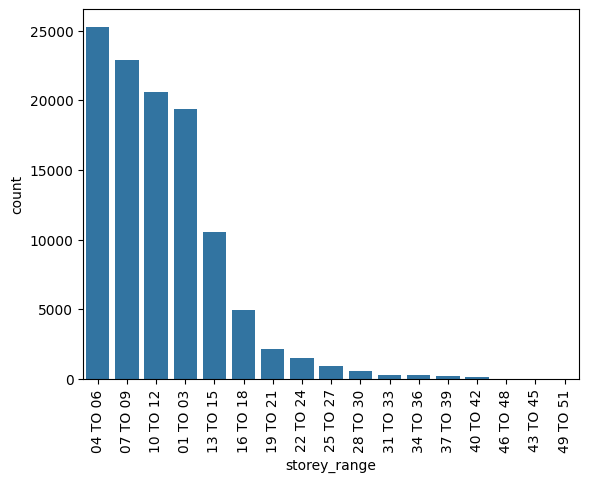

,count
storey_range,
04 TO 06,25263
07 TO 09,22876
10 TO 12,20591
01 TO 03,19361
13 TO 15,10571
16 TO 18,4971
19 TO 21,2140
22 TO 24,1508
25 TO 27,911


In [ ]:
sns.barplot(df_story_range['storey_range'].value_counts())
plt.xticks(rotation = 90)
plt.show()
display(df_story_range['storey_range'].value_counts())

<b> Most resale flats sold are not of high floors.

In [ ]:
df_story_range['max_floor'] = df_story_range['storey_range'].str.split().apply(lambda x: x[-1]).astype(np.int8)

In [ ]:
df_story_range.head()

,storey_range,adjusted_price,max_floor
121143,01 TO 03,555035.812017,3
58782,10 TO 12,538540.708745,12
123320,07 TO 09,475471.629042,9
104054,10 TO 12,275624.169987,12
86607,13 TO 15,457645.184649,15


<Axes: xlabel='adjusted_price', ylabel='max_floor'>

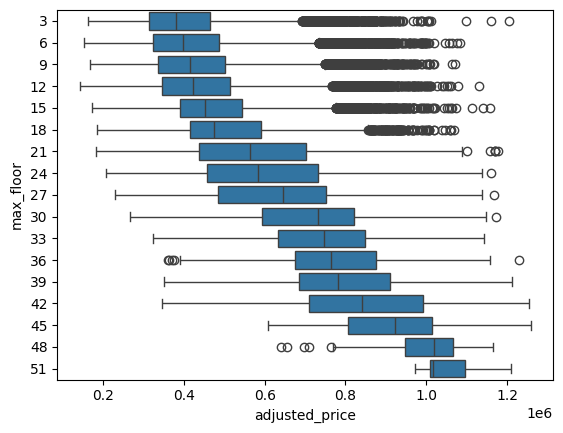

In [ ]:
sns.boxplot(data = df_story_range, x = 'adjusted_price', y = 'max_floor', orient = 'h')

<b> In general, the higher the floor, the higher the price of the flat </b>

<Axes: xlabel='adjusted_price', ylabel='max_floor_cat'>

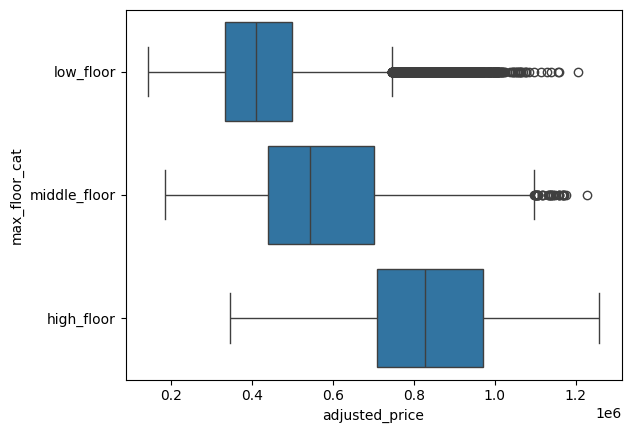

In [ ]:
def transform2_v2(df: pd.DataFrame):
  def t2(row):
    bins = [0, 18, 39, float('inf')]
    labels = ['low_floor', 'middle_floor', 'high_floor']
    for i in range(len(bins)):
      if row < bins[i + 1]:
        return labels[i]
  df['max_floor_cat'] = df['max_floor'].apply(t2)
  return df

df_story_range_2_v2 = df_story_range[['max_floor', 'adjusted_price']]
df_story_range_2_v2 = transform2_v2(df_story_range_2_v2)

group_means = df_story_range_2_v2.groupby(['max_floor_cat'])['adjusted_price'].median().sort_values(ascending=True)
sns.boxplot(data = df_story_range_2_v2, x = 'adjusted_price', y = 'max_floor_cat', order = group_means.index)

<b>Clustering to categories such as low_floor, middle_floor and high_floor helps reduce the number of categories while still allowing the flats to be split. Still we must note low floor flats can still reach prices of high floor flats</b>

In [ ]:
cluster_size = [i for i in range(2, len(df_storey_range['storey_range'].unique()) + 1)]
c_score = []
for c_size in cluster_size:
  category_mean_prices = df_storey_range.copy().groupby('storey_range')['adjusted_price'].mean().reset_index()
  category_mean_prices.columns = ['storey_range', 'mean_price']
  # Prepare the data for clustering (mean price for each category)
  X = category_mean_prices[['mean_price']].values

  # Perform KMeans clustering (e.g., 2 clusters in this example)
  kmeans = KMeans(n_clusters=2, random_state=42)
  category_mean_prices['cluster'] = kmeans.fit_predict(X)

  # Map the cluster labels to the original dataframe
  df_storey_range_2 = df_storey_range.copy()
  df_storey_range_2 = df_storey_range_2.merge(category_mean_prices[['storey_range', 'cluster']], on='storey_range', how='left')

  # Calculate silhouette score on continuous target values
  df_storey_range_3 = df_storey_range_2.sample(10000)
  for i in range(5):
    silhouette_avg = silhouette_score(df_storey_range_3[['adjusted_price']], df_storey_range_3['cluster'], metric='euclidean')
    c_score.append(silhouette_avg)
  print(f"Silhouette Score (n = {c_size}): {sum(c_score) / 5}")
  c_score.clear()

Silhouette Score (n = 2): 0.46937750366496706
Silhouette Score (n = 3): 0.48523900394447894
Silhouette Score (n = 4): 0.49185101973511536
Silhouette Score (n = 5): 0.4799038189597812
Silhouette Score (n = 6): 0.4252863360618152
Silhouette Score (n = 7): 0.46142557639044535
Silhouette Score (n = 8): 0.48555808739085976
Silhouette Score (n = 9): 0.47731011972529985
Silhouette Score (n = 10): 0.4700827280477845
Silhouette Score (n = 11): 0.506919211047169
Silhouette Score (n = 12): 0.521227023822177
Silhouette Score (n = 13): 0.5194908247353136
Silhouette Score (n = 14): 0.5250370775213008
Silhouette Score (n = 15): 0.46690963291256865
Silhouette Score (n = 16): 0.5098566818949947
Silhouette Score (n = 17): 0.48698043831134574


<b> Can clustter in the 11 to 14 clustter level

## Flat Type EDA

In [ ]:
df_flat_type = pd.DataFrame(df[['flat_type', 'adjusted_price']])

In [ ]:
df_flat_type['flat_type'].unique()

array(['5 ROOM', '3 ROOM', '4 ROOM', 'EXECUTIVE', '2 ROOM',
       'MULTI-GENERATION', '1 ROOM'], dtype=object)

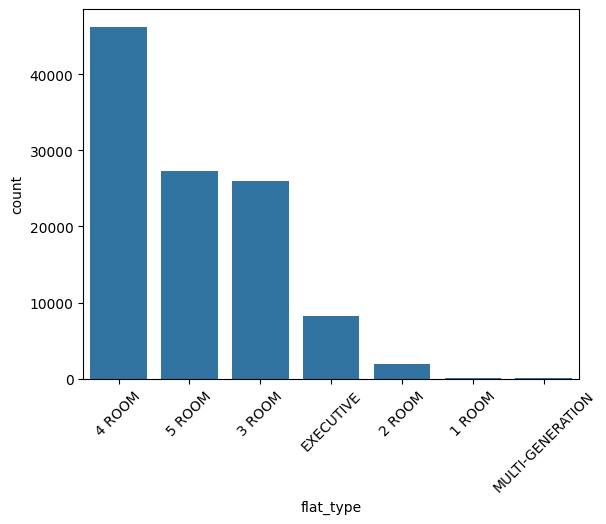

,count
flat_type,
4 ROOM,46236
5 ROOM,27337
3 ROOM,25974
EXECUTIVE,8205
2 ROOM,1947
1 ROOM,45
MULTI-GENERATION,42


In [ ]:
sns.barplot(df_flat_type['flat_type'].value_counts())
plt.xticks(rotation = 45)
plt.show()
display(df_flat_type['flat_type'].value_counts())

<b> Most flats are 3-5 Room flats, with 4 Room being the most

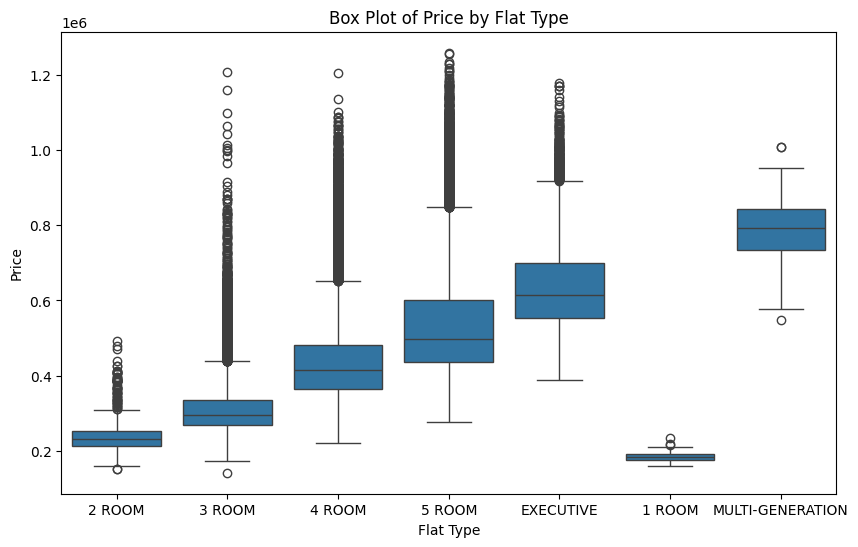

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_flat_type, x='flat_type', y='adjusted_price')
plt.title('Box Plot of Price by Flat Type')
plt.xlabel('Flat Type')
plt.ylabel('Price')
plt.show()

<b>Flat Type appears to influence adjusted_price, with distinct splits in general and higher medians observed for flats deemed "larger" or more exclusive i.e. 5 Room, Excutive

## Flat Model EDA

In [ ]:
df_flat_model = df[['flat_model', 'adjusted_price']]

<Axes: xlabel='adjusted_price', ylabel='flat_model'>

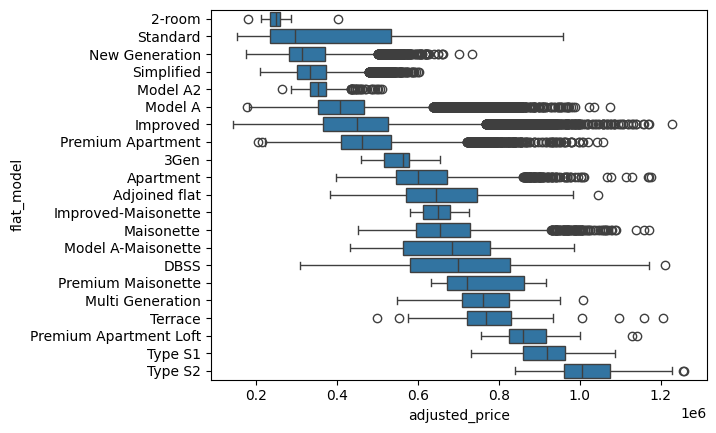

In [ ]:
group_means = df_flat_model.groupby(['flat_model'])['adjusted_price'].median().sort_values(ascending=True)
sns.boxplot(data = df_flat_model, x = 'adjusted_price', y = 'flat_model', orient = 'h', order = group_means.index)

<b> Flat model helps provide splits in pricing. Still there are some such as Model A and Improved with many outliers that may affect the splits

## EDA Distance to Park

In [ ]:
df_distance_to_park = df[['adjusted_price', 'distance_to_park']]

<Axes: xlabel='distance_to_park', ylabel='Count'>

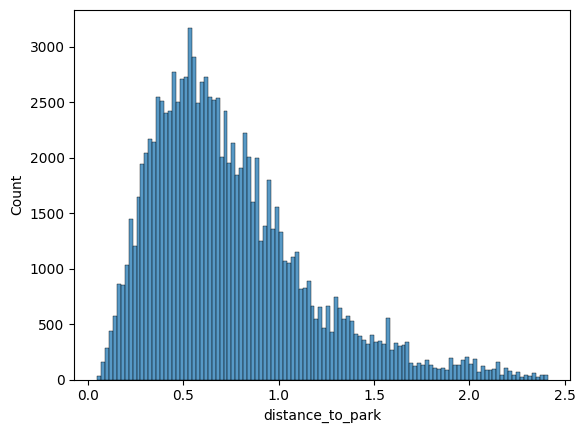

In [ ]:
sns.histplot(df_distance_to_park['distance_to_park'])

<b> Distance to park seems positively skewed. This alligns with expectations with HDB flats being built with ammenities.

<Axes: xlabel='distance_to_park', ylabel='Count'>

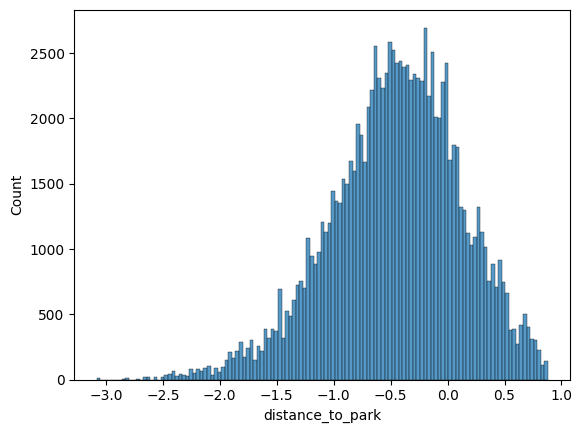

In [ ]:
sns.histplot(np.log(df_distance_to_park['distance_to_park']))

<b> Applying the log transform seems to worsen the distribution

<Axes: title={'center': 'Plot of distance_to_park against adjusted_price'}, xlabel='distance_to_park', ylabel='adjusted_price'>

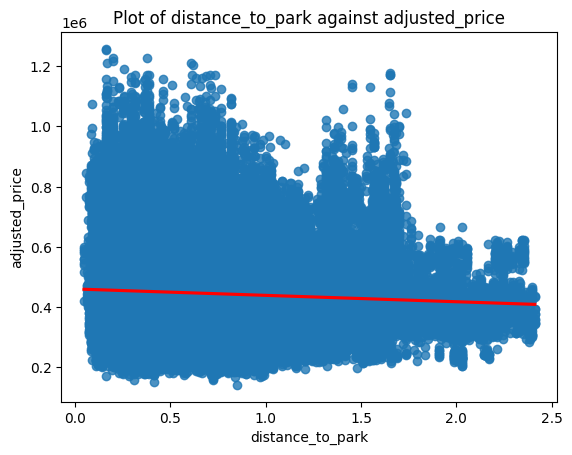

In [ ]:
plt.title('Plot of distance_to_park against adjusted_price')
sns.regplot(data = df_distance_to_park, x = 'distance_to_park', y = 'adjusted_price', line_kws = {'color': 'red'})

<Axes: >

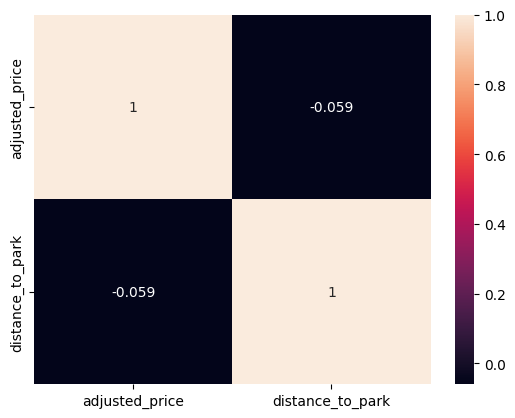

In [ ]:
sns.heatmap(df_distance_to_park.corr(), annot = True)

<Axes: >

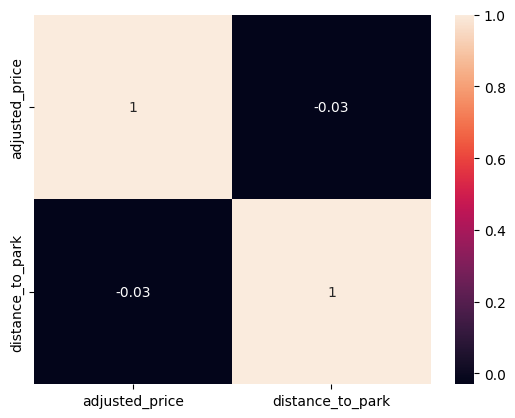

In [ ]:
df_log_park = df_distance_to_park.copy()
df_log_park['adjusted_price'] = df_log_park['adjusted_price'].apply(np.log)
sns.heatmap(df_log_park.corr(), annot = True)

<b>In general, distance_to_park on its own has a week correlation with the adjusted price. Applying log to adjusted_prices also does not improve the correlation</b>

,adjusted_price
adjusted_price,1.000000
distance_to_park,-0.059419
remove_out_distance_to_park,-0.062377
ss_distance_to_park,-0.059419
distance_to_park_squared,-0.048216
distance_to_park_log,-0.071315
distance_to_park_sqrt,-0.065882


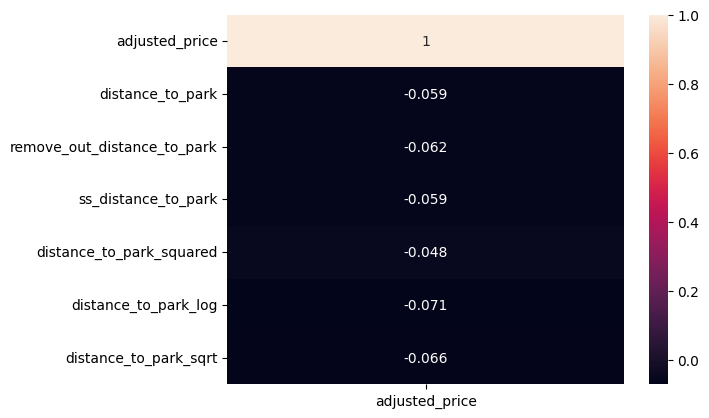

In [ ]:
hypotest_apply(df_distance_to_park)

<b> In general, some transformations improve correlation, but not to a large extent.

In [ ]:
df_distance_to_park_plot = df[['adjusted_price', 'distance_to_park', 'flat_type']]

<Axes: xlabel='distance_to_park', ylabel='adjusted_price'>

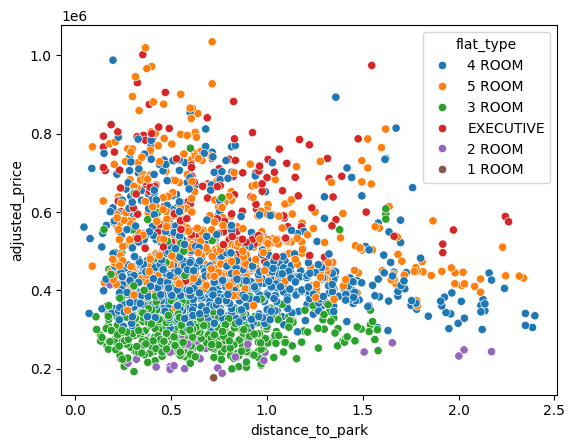

In [ ]:
sns.scatterplot(data = df_distance_to_park_plot.sample(2000), x = 'distance_to_park', y = 'adjusted_price', hue = 'flat_type')

<b> When distance_to_park is combined with flat type, it seems to affect the adjusted price, with lower distance_to_park leading to higher prices in general.</b>

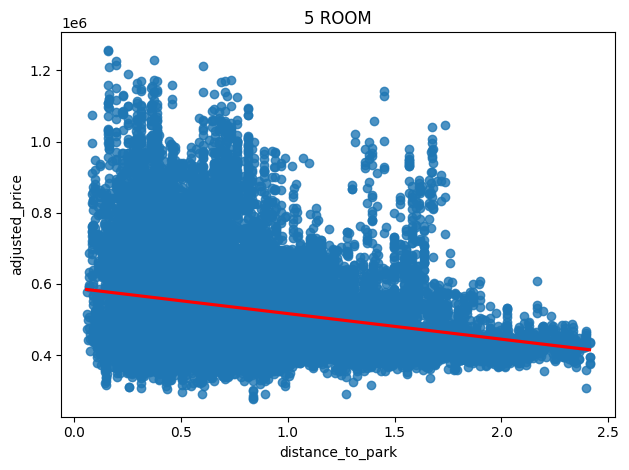

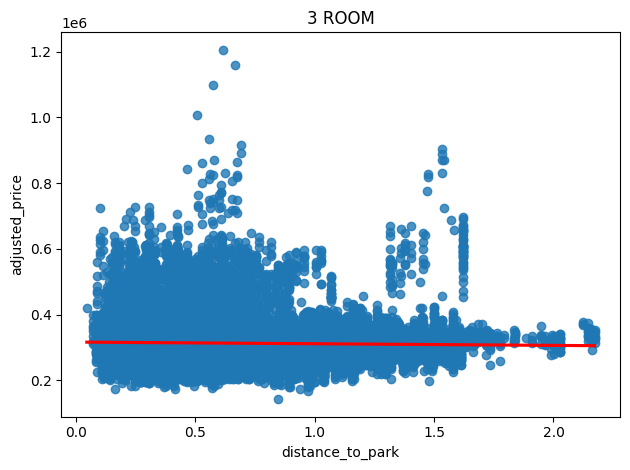

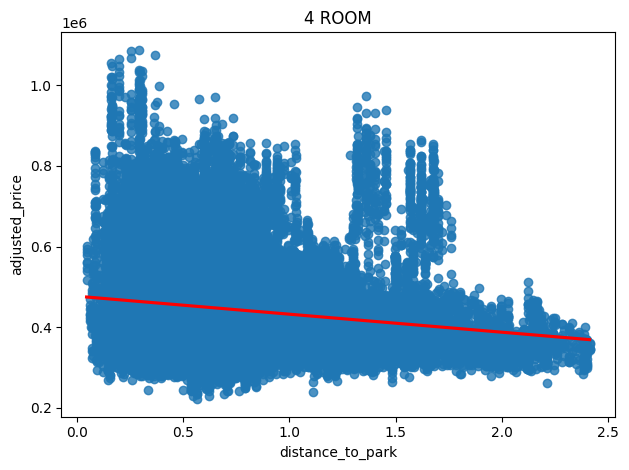

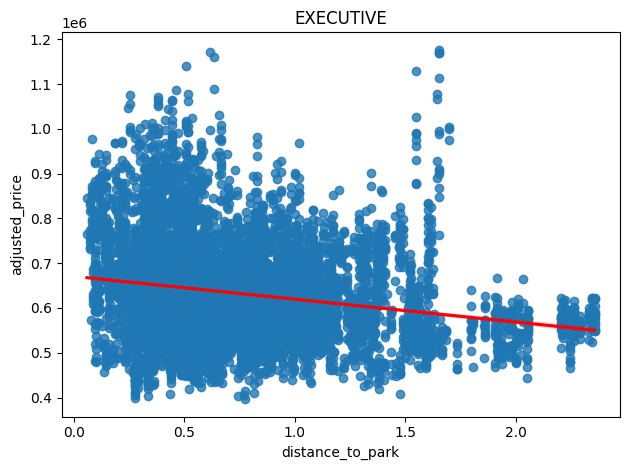

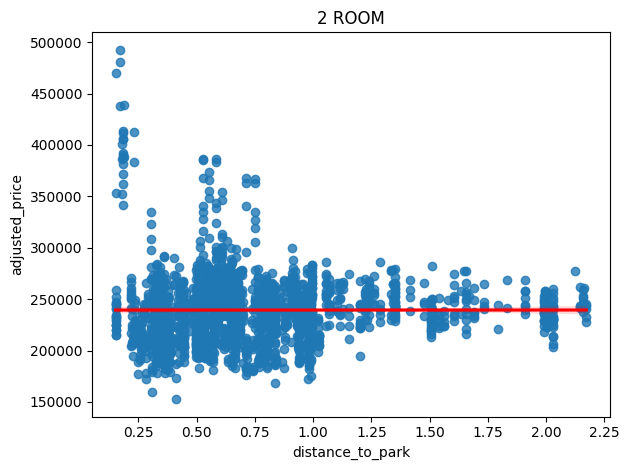

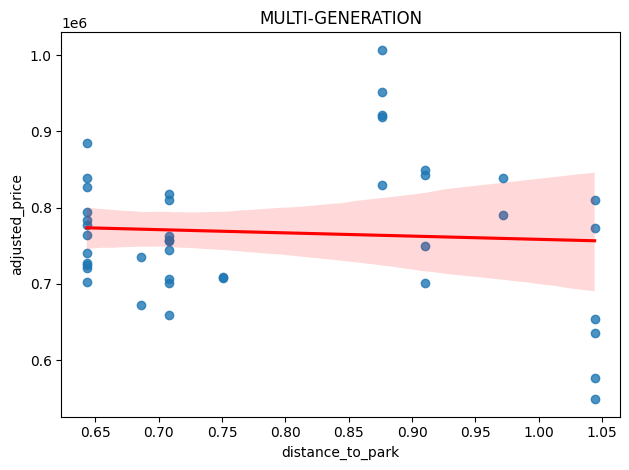

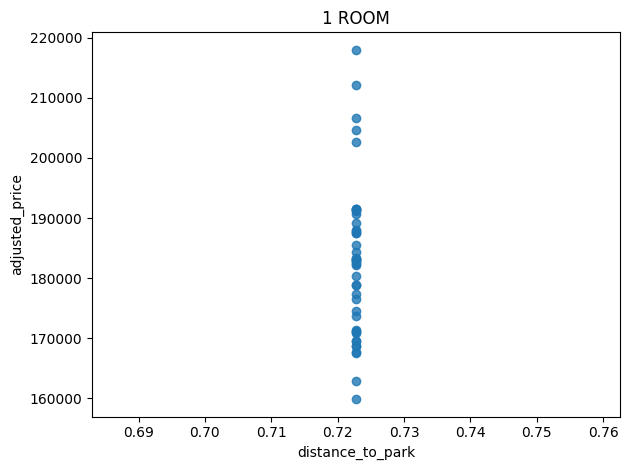

In [ ]:
flat_types = df_distance_to_park_plot['flat_type'].unique()

for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_park_plot[df_distance_to_park_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_park',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.tight_layout()
    plt.show()
  except KeyboardInterrupt:
    break


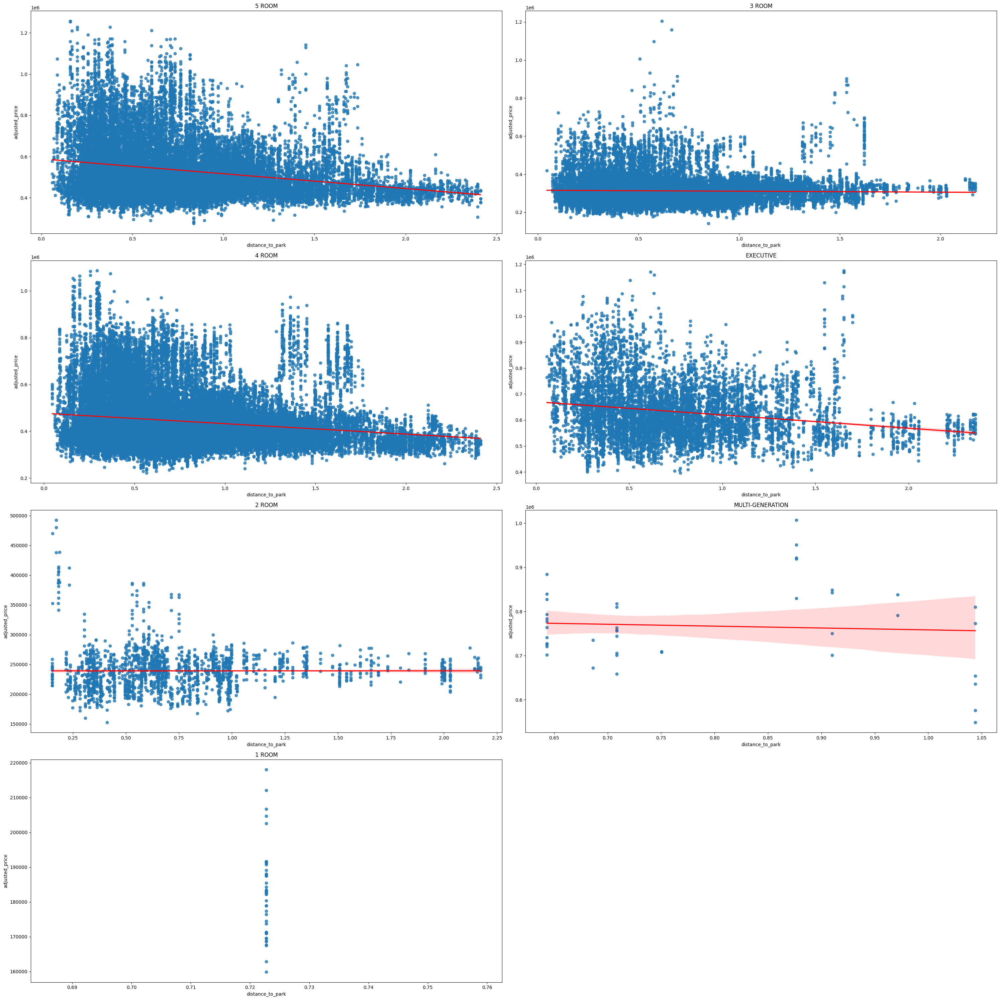

In [ ]:
flat_types = df_distance_to_park_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_park_plot[df_distance_to_park_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_park',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

In [ ]:
df_distance_to_park_plot.groupby('flat_type').corr()

adjusted_price  distance_to_park
flat_type                                                          
1 ROOM           adjusted_price          1.000000               NaN
                 distance_to_park             NaN               NaN
2 ROOM           adjusted_price          1.000000          0.000313
                 distance_to_park        0.000313          1.000000
3 ROOM           adjusted_price          1.000000         -0.023040
                 distance_to_park       -0.023040          1.000000
4 ROOM           adjusted_price          1.000000         -0.168502
                 distance_to_park       -0.168502          1.000000
5 ROOM           adjusted_price          1.000000         -0.232044
                 distance_to_park       -0.232044          1.000000
EXECUTIVE        adjusted_price          1.000000         -0.203227
                 distance_to_park       -0.203227          1.000000
MULTI-GENERATION adjusted_price          1.000000         -0.067004
                 distance_to_park       -0.067004          1.000000

<b> For 4 room, 5 room and Executive, there is more correlation with distance_to_park. For the other flat_types, there is a weaker correlation or almost no correlation</b>

## EDA Distance to MRT

In [ ]:
df_distance_to_mrt = df[['adjusted_price', 'distance_to_mrt']]

<Axes: xlabel='distance_to_mrt', ylabel='Count'>

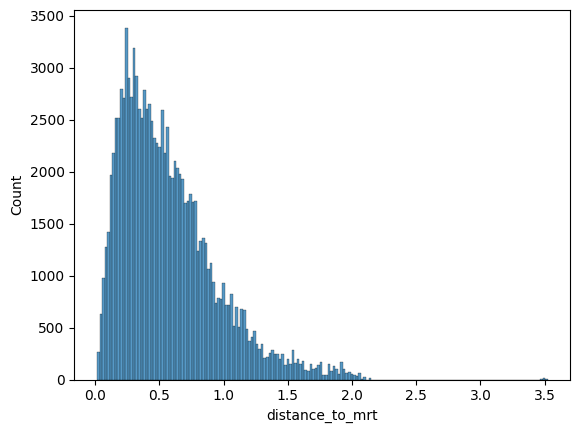

In [ ]:
sns.histplot(df_distance_to_mrt['distance_to_mrt'])

<Axes: xlabel='distance_to_mrt', ylabel='Count'>

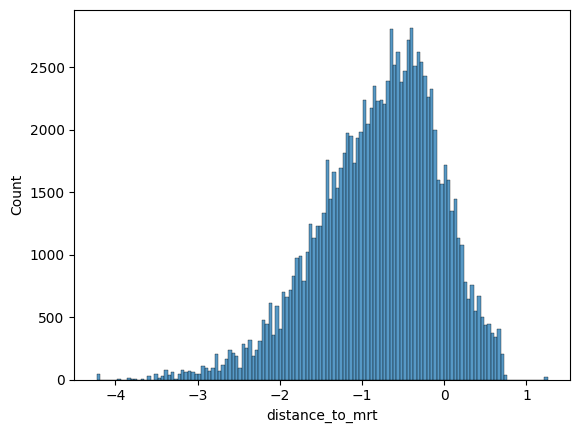

In [ ]:
sns.histplot(np.log(df_distance_to_mrt['distance_to_mrt']))

<b> Distance_to_mrt is positively skewed. However a log transform does not improve the magnitude of skew based of the figures

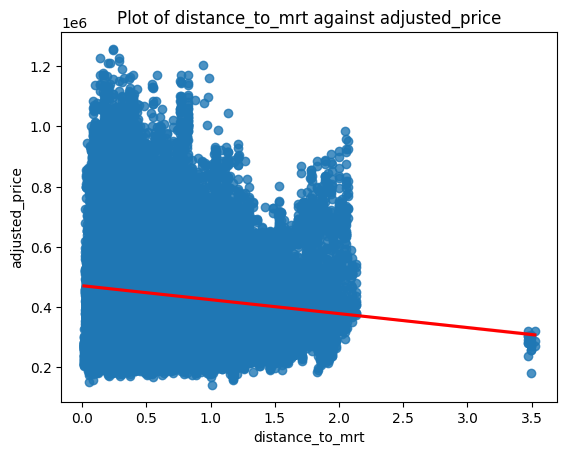

In [ ]:
plt.title('Plot of distance_to_mrt against adjusted_price')
sns.regplot(data = df_distance_to_mrt, x = 'distance_to_mrt', y = 'adjusted_price', line_kws = {'color': 'red'})
plt.show()

<Axes: >

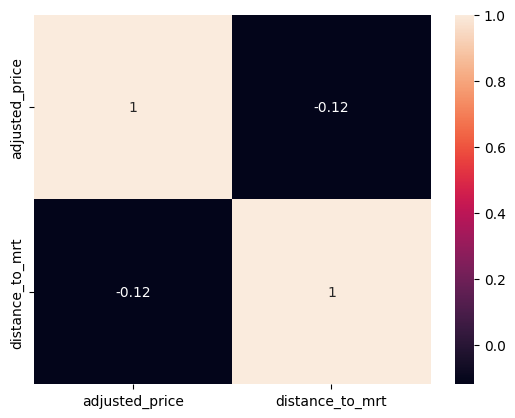

In [ ]:
sns.heatmap(df_distance_to_mrt.corr(), annot = True)

<b> The distance_to_mrt has a weak correlation with adjusted_price

<Axes: >

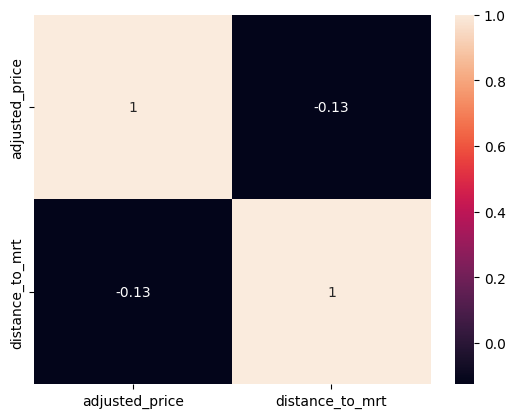

In [ ]:
df_mrt_log_price = df_distance_to_mrt.copy()
df_mrt_log_price['adjusted_price'] = df_mrt_log_price['adjusted_price'].apply(np.log)
sns.heatmap(df_mrt_log_price.corr(), annot = True)

<b> Correlation against log adjusted_price does not yield much improvement

,adjusted_price
adjusted_price,1.000000
distance_to_mrt,-0.119672
remove_out_distance_to_mrt,-0.149003
ss_distance_to_mrt,-0.119672
distance_to_mrt_squared,-0.084888
distance_to_mrt_log,-0.125702
distance_to_mrt_sqrt,-0.129030


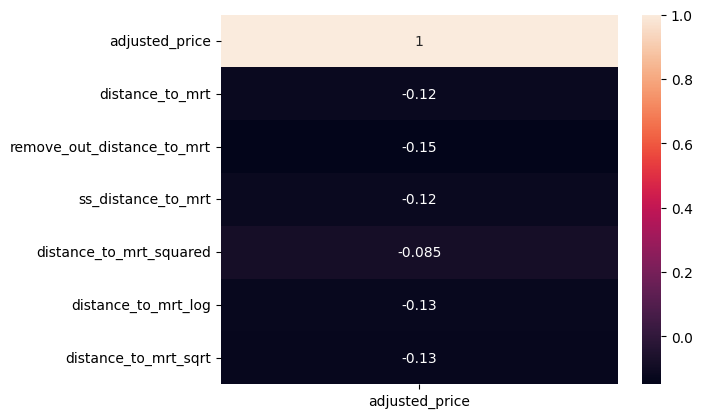

In [ ]:
hypotest_apply(df_distance_to_mrt)

<b> Transformations applied do not significantly improve the correlation</b>

In [ ]:
df_distance_to_mrt_plot = df[['adjusted_price', 'distance_to_mrt', 'flat_type']]

<Axes: xlabel='distance_to_mrt', ylabel='adjusted_price'>

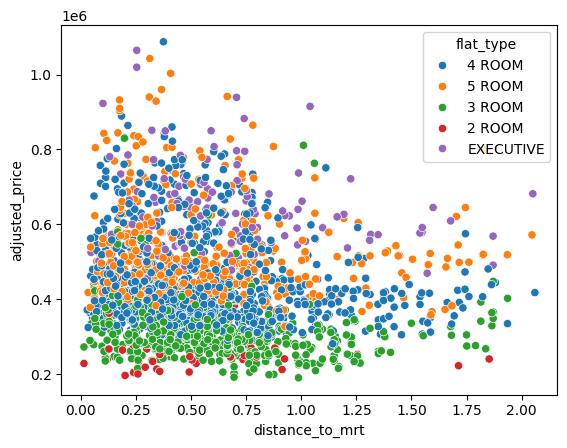

In [ ]:
sns.scatterplot(data = df_distance_to_mrt_plot.sample(2000), x = 'distance_to_mrt', y = 'adjusted_price', hue = 'flat_type')

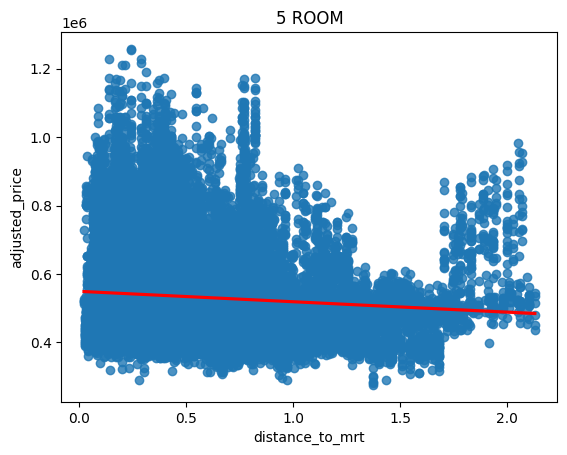

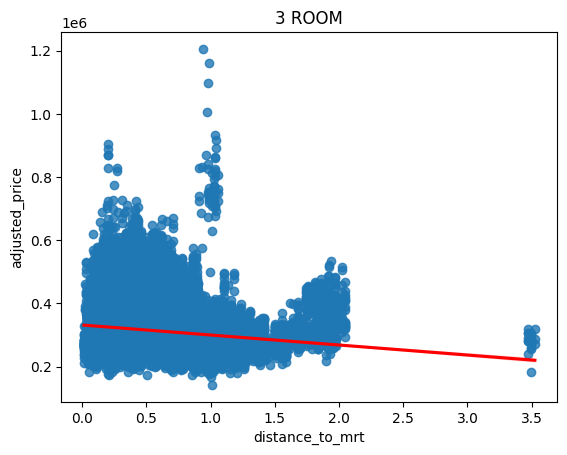

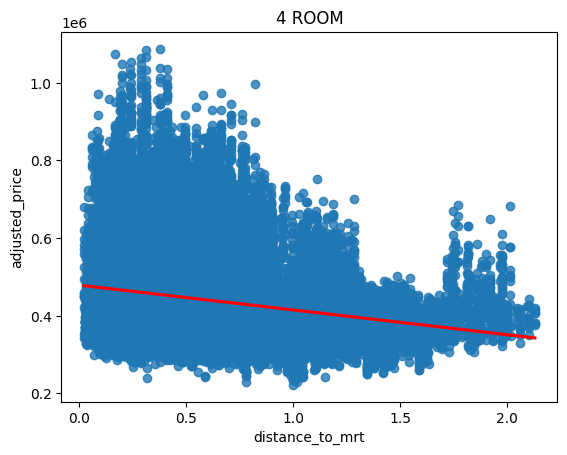

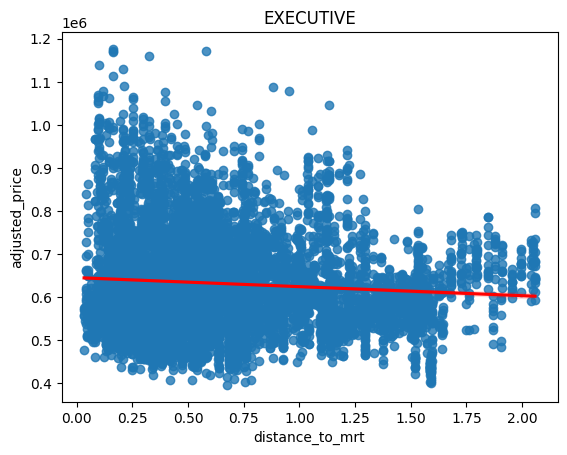

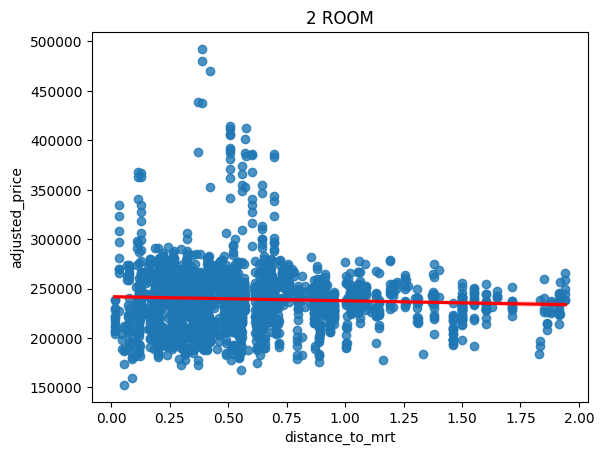

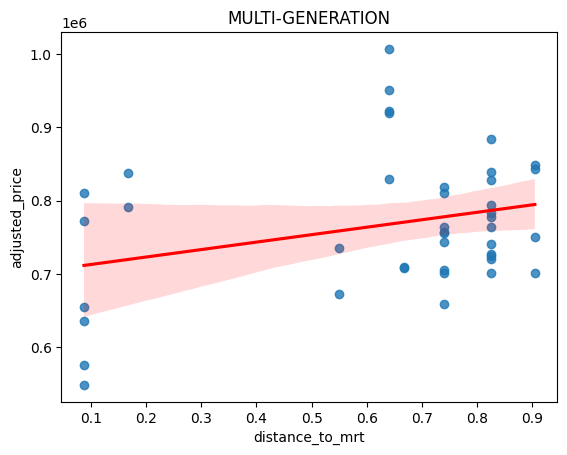

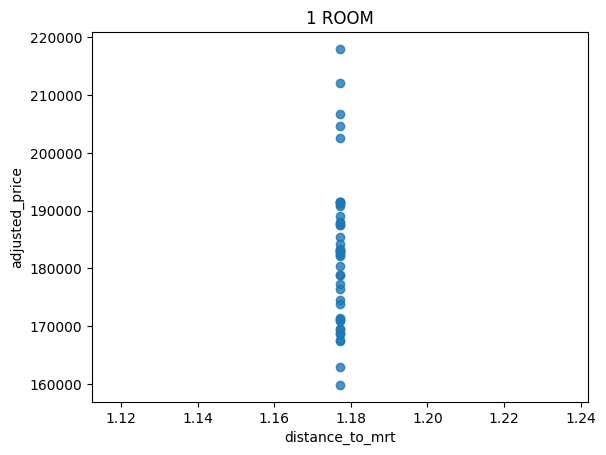

In [ ]:
flat_types = df_distance_to_mrt_plot['flat_type'].unique()

for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_mrt_plot[df_distance_to_mrt_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_mrt',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.show()
  except KeyboardInterrupt:
    break

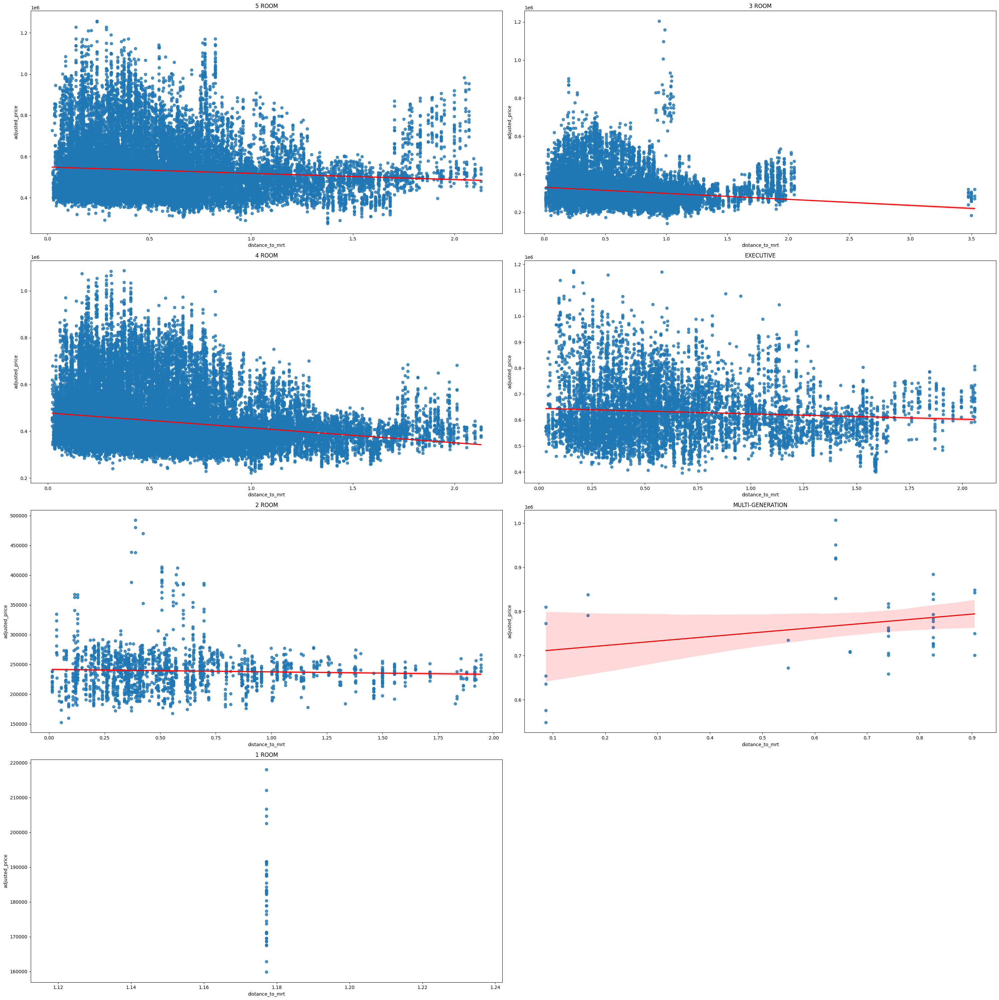

In [ ]:
flat_types = df_distance_to_mrt_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_mrt_plot[df_distance_to_mrt_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_mrt',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

In [ ]:
df_distance_to_mrt_plot.groupby('flat_type').corr()

adjusted_price  distance_to_mrt
flat_type                                                        
1 ROOM           adjusted_price         1.000000              NaN
                 distance_to_mrt             NaN              NaN
2 ROOM           adjusted_price         1.000000        -0.050198
                 distance_to_mrt       -0.050198         1.000000
3 ROOM           adjusted_price         1.000000        -0.158203
                 distance_to_mrt       -0.158203         1.000000
4 ROOM           adjusted_price         1.000000        -0.212196
                 distance_to_mrt       -0.212196         1.000000
5 ROOM           adjusted_price         1.000000        -0.086947
                 distance_to_mrt       -0.086947         1.000000
EXECUTIVE        adjusted_price         1.000000        -0.079065
                 distance_to_mrt       -0.079065         1.000000
MULTI-GENERATION adjusted_price         1.000000         0.298694
                 distance_to_mrt        0.298694         1.000000

<b> Especially for 4 room and 3 room flats, there is higher negative correlation with adjusted price relative to the rest of the flat_types</b>

[nan, -0.050198447939179436, -0.15820299317711617, -0.21219576683799063, -0.08694667974563522, -0.079064635287425, 0.29869404520962095]


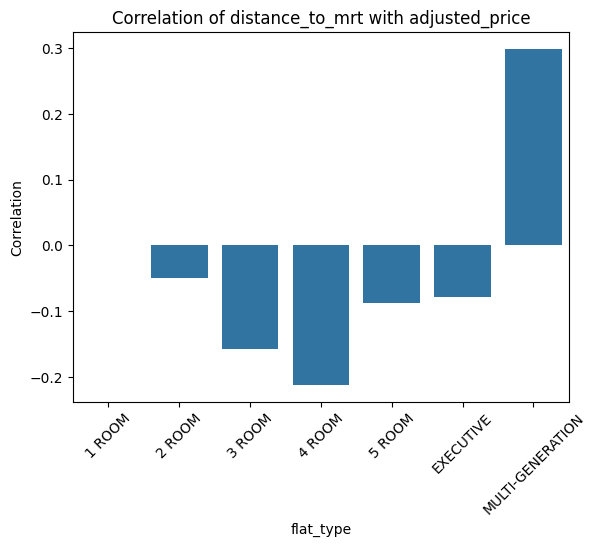

In [ ]:
bar_chart_data = []
xticks_xlabels = []
corr_matrix = df_distance_to_mrt_plot.groupby('flat_type').corr()
for i in range(len(flat_types)):
  corr_val = corr_matrix.iloc[2 * i].iloc[1]
  bar_chart_data.append(corr_val)
  xticks_xlabels.append(corr_matrix.index[2 * i][0])
print(bar_chart_data)
fig = sns.barplot(bar_chart_data)
fig.xaxis.set_ticks(ticks = fig.get_xticks(), labels = xticks_xlabels, rotation = 45)
plt.ylabel("Correlation")
plt.xlabel("flat_type")
plt.title("Correlation of distance_to_mrt with adjusted_price")
plt.show()

<b> Multi-generation interestingly has a higher correlation but it is instead a positive one

## EDA Distance to Sports Facilities

In [ ]:
df_distance_to_sports_facilities = df[['adjusted_price', 'distance_to_sports_facilities']]

<Axes: ylabel='Count'>

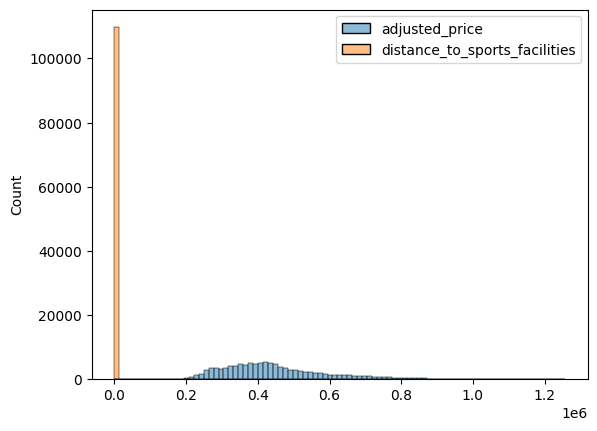

In [ ]:
sns.histplot(df_distance_to_sports_facilities)

<Axes: ylabel='Count'>

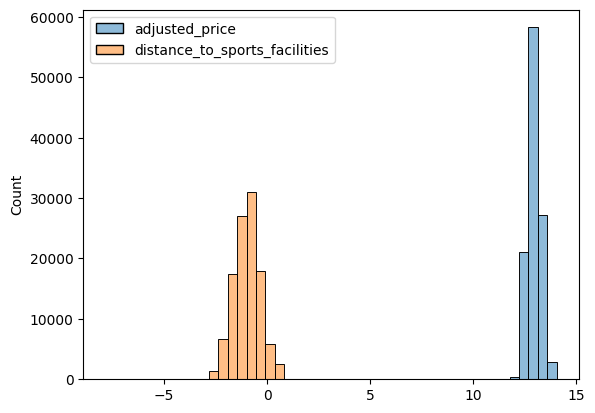

In [ ]:
sns.histplot(np.log(df_distance_to_sports_facilities))

<b> The distribution of distance_to_sports_facilities is unique. This is with many values being of the same magnitude

<Axes: title={'center': 'Plot of distance_to_sports_facilities against adjusted_price'}, xlabel='distance_to_sports_facilities', ylabel='adjusted_price'>

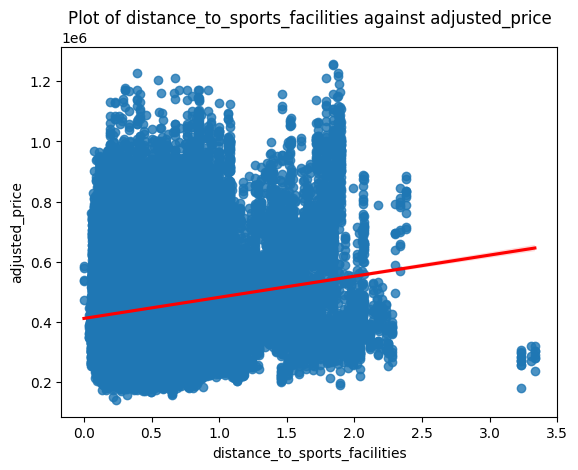

In [ ]:
plt.title('Plot of distance_to_sports_facilities against adjusted_price')
sns.regplot(data = df_distance_to_sports_facilities, x = 'distance_to_sports_facilities', y = 'adjusted_price', line_kws = {'color': 'red'})

<Axes: >

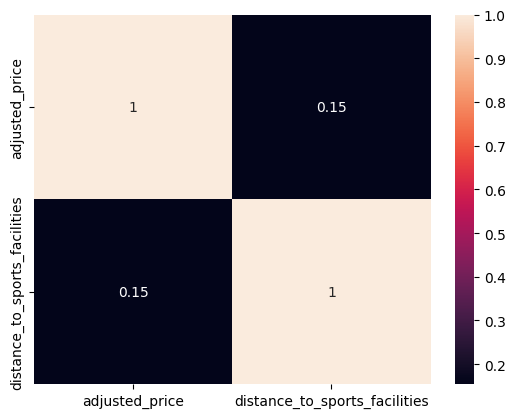

In [ ]:
sns.heatmap(df_distance_to_sports_facilities.corr(), annot = True)

<b> There is a possitive correlation between adjusted_price and distance_to_sports_facilites. This is interesting as access to such facilities would seem more likely to increase the price of a flat. However, this could be due to other more influencing factors

<Axes: >

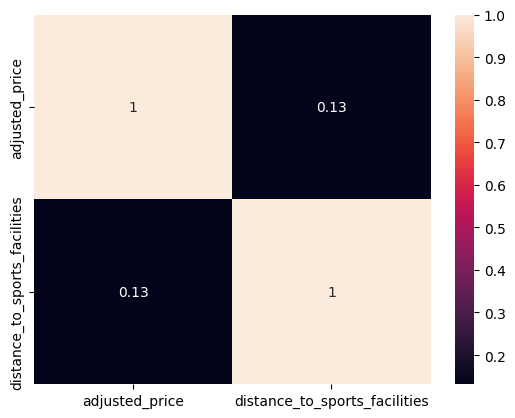

In [ ]:
df_log_price_sports = df_distance_to_sports_facilities.copy()
df_log_price_sports['adjusted_price'] = df_log_price_sports['adjusted_price'].apply(np.log)
sns.heatmap(df_log_price_sports.corr(), annot = True)

<b> Applying log to the adjusted_price does not seem to improve correlation

,adjusted_price
adjusted_price,1.000000
distance_to_sports_facilities,0.154330
remove_out_distance_to_sports_facilities,0.093763
ss_distance_to_sports_facilities,0.154330
distance_to_sports_facilities_squared,0.156985
distance_to_sports_facilities_log,0.116024
distance_to_sports_facilities_sqrt,0.138933


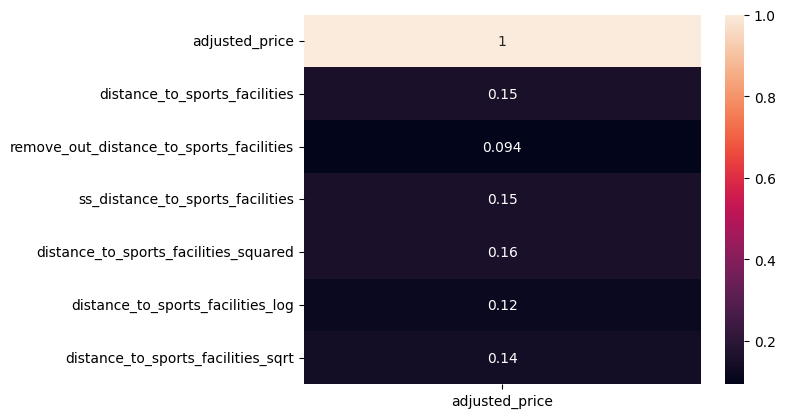

In [ ]:
hypotest_apply(df_distance_to_sports_facilities)

<b> Transformations do not really improve the correlation

In [ ]:
df_distance_to_sports_facilities_plot = df[['adjusted_price', 'distance_to_sports_facilities', 'flat_type']]

<Axes: xlabel='distance_to_sports_facilities', ylabel='adjusted_price'>

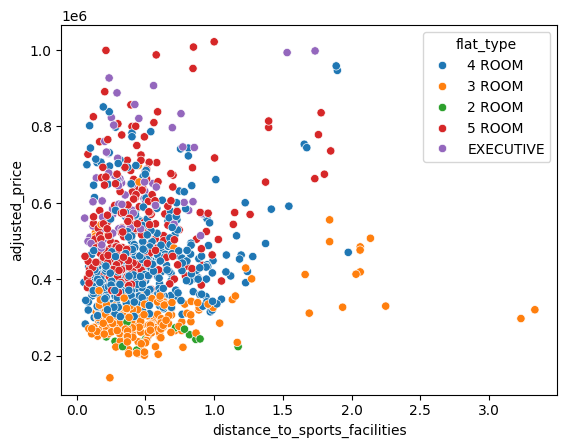

In [ ]:
sns.scatterplot(data = df_distance_to_sports_facilities_plot.sample(1000), x = 'distance_to_sports_facilities', y = 'adjusted_price', hue = 'flat_type')

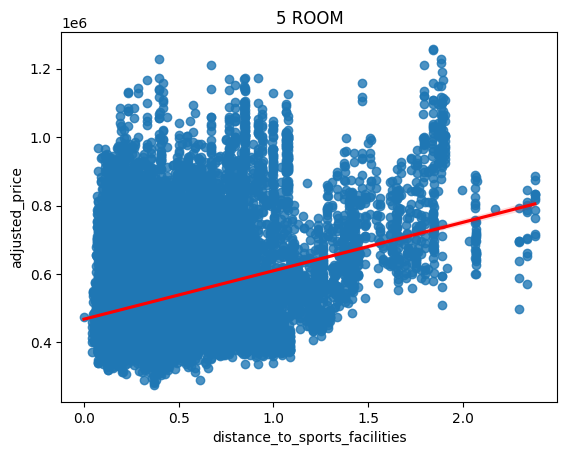

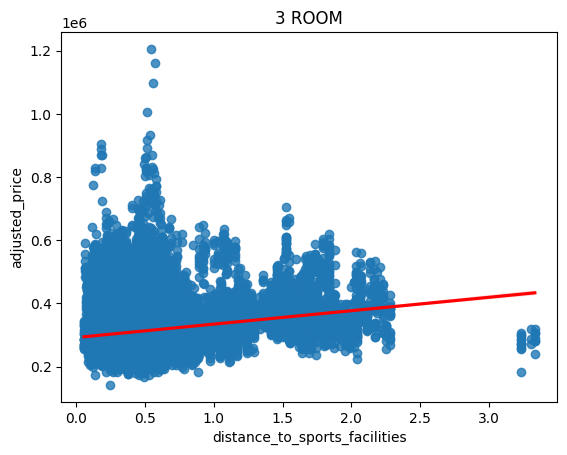

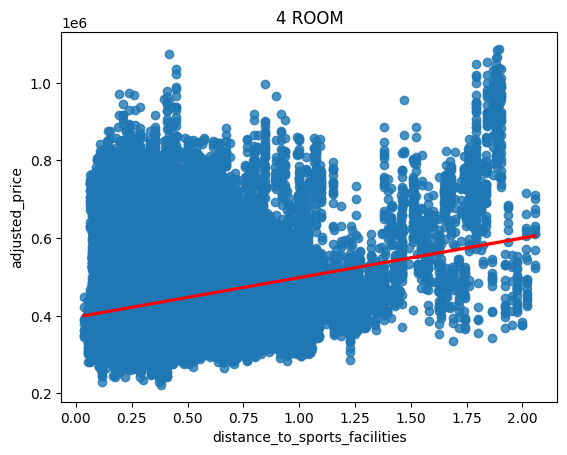

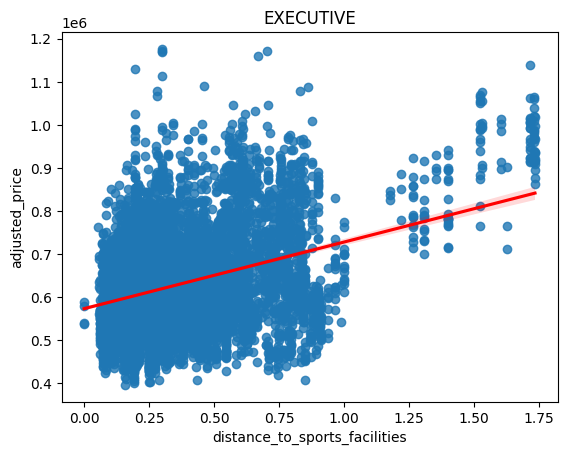

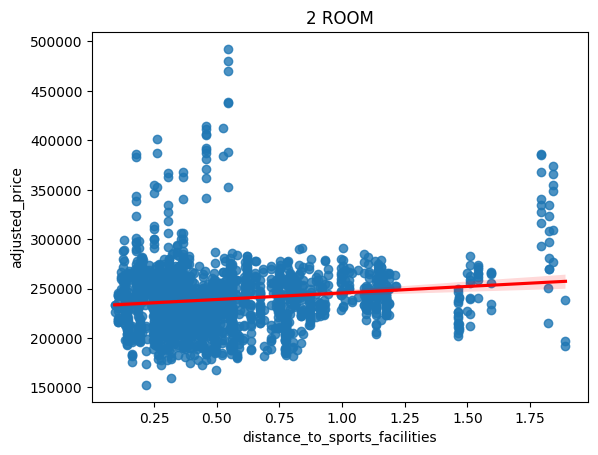

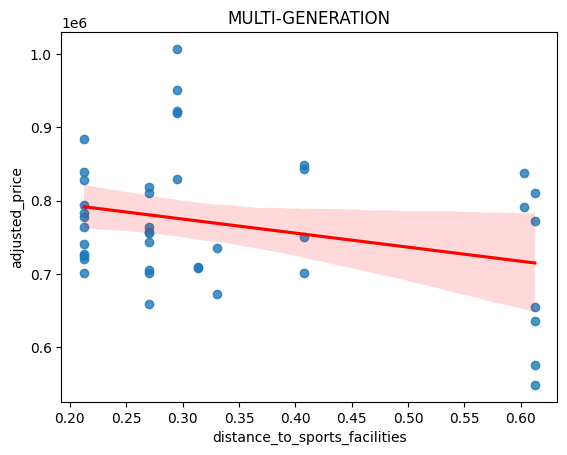

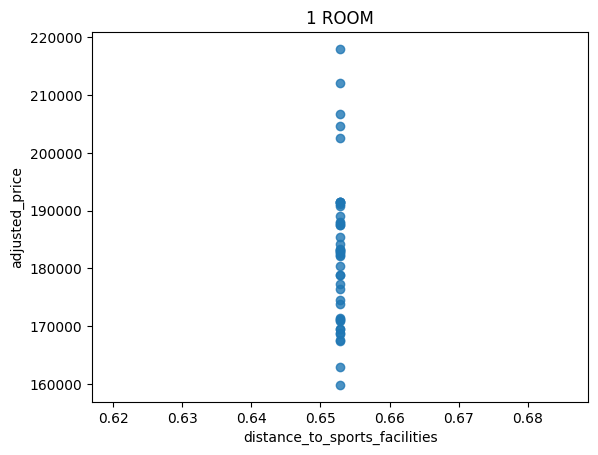

In [ ]:
flat_types = df_distance_to_sports_facilities_plot['flat_type'].unique()


for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_sports_facilities_plot[df_distance_to_sports_facilities_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_sports_facilities',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.show()
  except KeyboardInterrupt:
    break

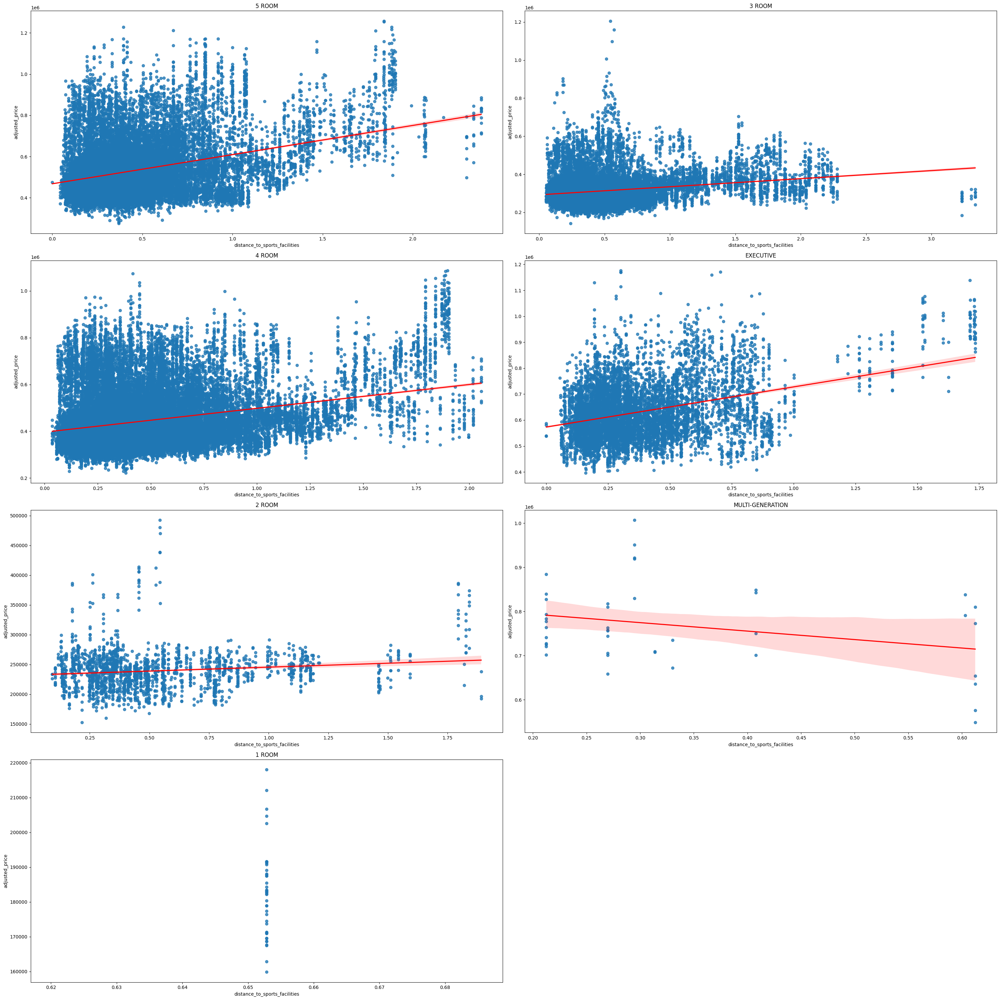

In [ ]:
flat_types = df_distance_to_sports_facilities_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_sports_facilities_plot[df_distance_to_sports_facilities_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_sports_facilities',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

In [ ]:
df_distance_to_sports_facilities_plot.groupby('flat_type').corr()

adjusted_price  \
flat_type                                                        
1 ROOM           adjusted_price                       1.000000   
                 distance_to_sports_facilities             NaN   
2 ROOM           adjusted_price                       1.000000   
                 distance_to_sports_facilities        0.133610   
3 ROOM           adjusted_price                       1.000000   
                 distance_to_sports_facilities        0.212000   
4 ROOM           adjusted_price                       1.000000   
                 distance_to_sports_facilities        0.281936   
5 ROOM           adjusted_price                       1.000000   
                 distance_to_sports_facilities        0.331495   
EXECUTIVE        adjusted_price                       1.000000   
                 distance_to_sports_facilities        0.345238   
MULTI-GENERATION adjusted_price                       1.000000   
                 distance_to_sports_facilities       -0.296466   

                                                distance_to_sports_facilities  
flat_type                                                                      
1 ROOM           adjusted_price                                           NaN  
                 distance_to_sports_facilities                            NaN  
2 ROOM           adjusted_price                                      0.133610  
                 distance_to_sports_facilities                       1.000000  
3 ROOM           adjusted_price                                      0.212000  
                 distance_to_sports_facilities                       1.000000  
4 ROOM           adjusted_price                                      0.281936  
                 distance_to_sports_facilities                       1.000000  
5 ROOM           adjusted_price                                      0.331495  
                 distance_to_sports_facilities                       1.000000  
EXECUTIVE        adjusted_price                                      0.345238  
                 distance_to_sports_facilities                       1.000000  
MULTI-GENERATION adjusted_price                                     -0.296466  
                 distance_to_sports_facilities                       1.000000

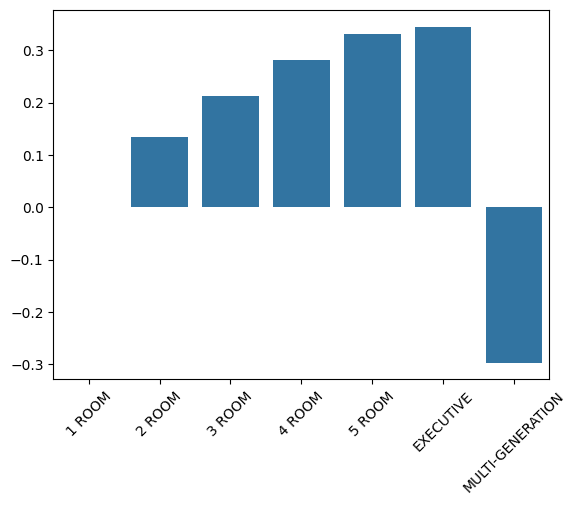

In [ ]:
bar_chart_data = []
xticks_xlabels = []
corr_matrix = df_distance_to_sports_facilities_plot.groupby('flat_type').corr()
for i in range(len(flat_types)):
  corr_val = corr_matrix.iloc[2 * i].iloc[1]
  bar_chart_data.append(corr_val)
  xticks_xlabels.append(corr_matrix.index[2 * i][0])
fig = sns.barplot(bar_chart_data)
fig.xaxis.set_ticks(ticks = fig.get_xticks(), labels = xticks_xlabels, rotation = 45)
plt.show()

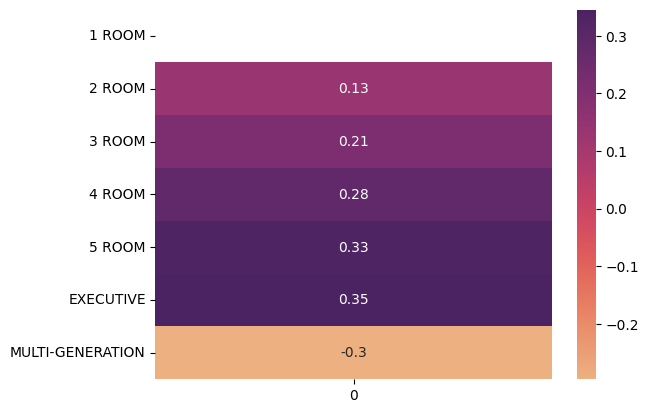

In [ ]:
fig = sns.heatmap(np.expand_dims(np.array(bar_chart_data), axis = 1), cmap = 'flare', annot = True)
fig.yaxis.set_ticks(ticks = fig.get_yticks(), labels = xticks_xlabels, rotation = 0)
plt.show()

<b>For 4 room, 5 room and executive, there is a stronger positive correlation with distance from sports facilities in comparison with the rest of the flat types. This suggest that the further a sporting facility, the more expensive the flat for those 3 flat types. This goes against the hypothesis that a nearby sports facility increases the price of the resale flat.

## EDA Distance to Primary School

In [ ]:
df_distance_to_pri_sch = df[['adjusted_price', 'distance_to_primary_school']]

<Axes: ylabel='Count'>

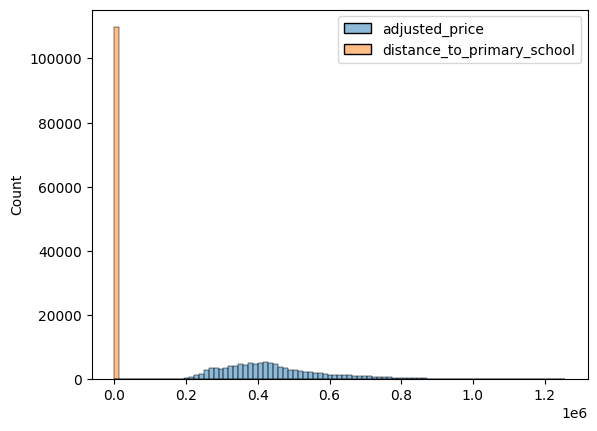

In [ ]:
sns.histplot(df_distance_to_pri_sch)

<Axes: ylabel='Count'>

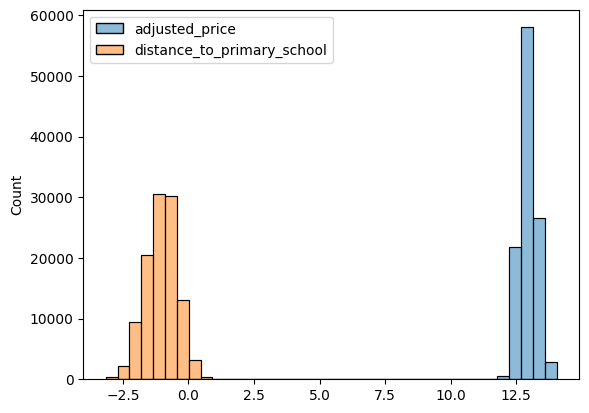

In [ ]:
sns.histplot(np.log(df_distance_to_pri_sch))

<b> The distribution for distance to primary school is similar to that of distance to sports facilities

<Axes: title={'center': 'Plot of distance_to_primary_school against adjusted_price'}, xlabel='distance_to_primary_school', ylabel='adjusted_price'>

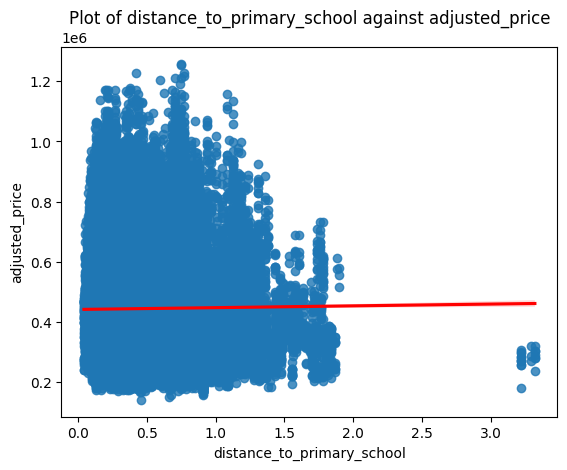

In [ ]:
plt.title('Plot of distance_to_primary_school against adjusted_price')
sns.regplot(data = df_distance_to_pri_sch, x = 'distance_to_primary_school', y = 'adjusted_price', line_kws = {'color': 'red'})

<Axes: >

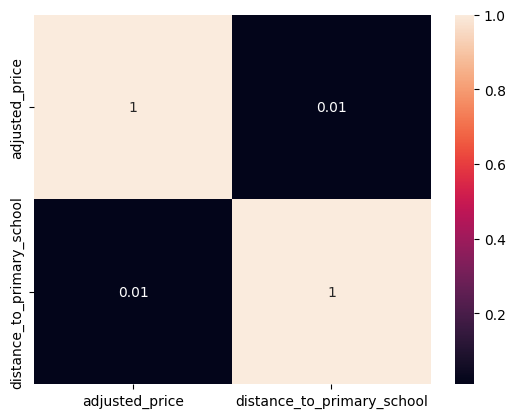

In [ ]:
sns.heatmap(df_distance_to_pri_sch.corr(), annot = True)

<b> There is extremely weak correlation / no correlation with adjusted_price

<Axes: >

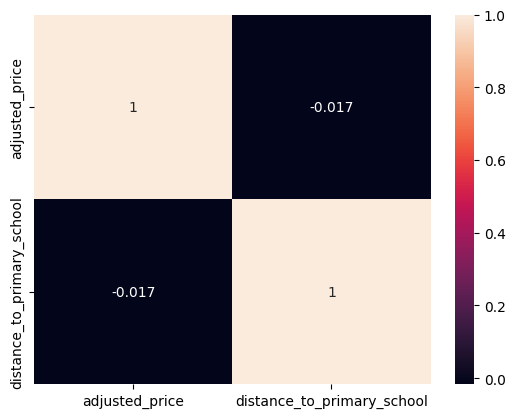

In [ ]:
df_pri_log_price = df_distance_to_pri_sch.copy()
df_pri_log_price['adjusted_price'] = df_pri_log_price['adjusted_price'].apply(np.log)
sns.heatmap(df_pri_log_price.corr(), annot = True)

<b> Even with log adjusted_price, there is not much improvements. The correlation is still very weak to none.

,adjusted_price
adjusted_price,1.000000
distance_to_primary_school,0.010328
remove_out_distance_to_primary_school,0.018917
ss_distance_to_primary_school,0.010328
distance_to_primary_school_squared,-0.006696
distance_to_primary_school_log,0.014541
distance_to_primary_school_sqrt,0.014291


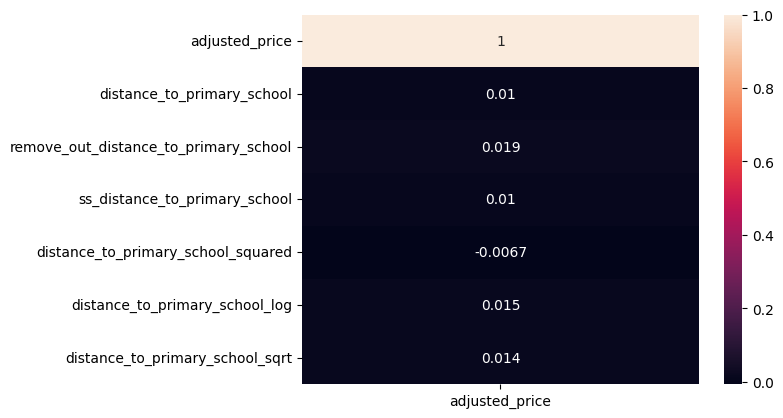

In [ ]:
hypotest_apply(df_distance_to_pri_sch)

<b> Functions applied to distance_to_primary_school does not improve the correlation by much.</b>

In [ ]:
df_distance_to_pri_sch_plot = df[['adjusted_price', 'distance_to_primary_school', 'flat_type']]

<Axes: xlabel='distance_to_primary_school', ylabel='adjusted_price'>

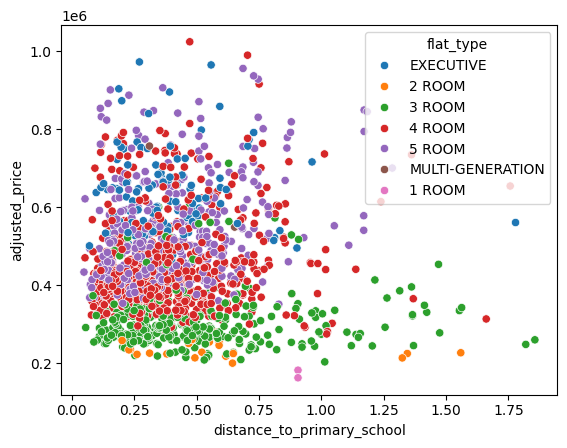

In [ ]:
sns.scatterplot(data = df_distance_to_pri_sch_plot.sample(1500), x = 'distance_to_primary_school', y = 'adjusted_price', hue = 'flat_type')

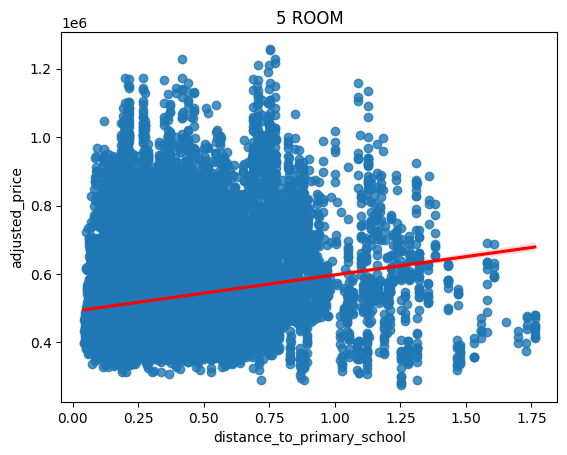

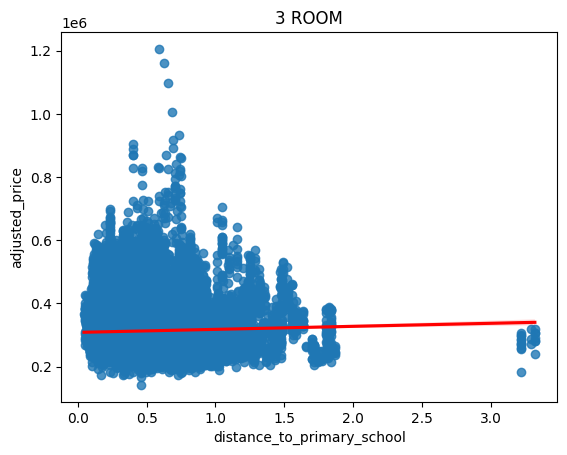

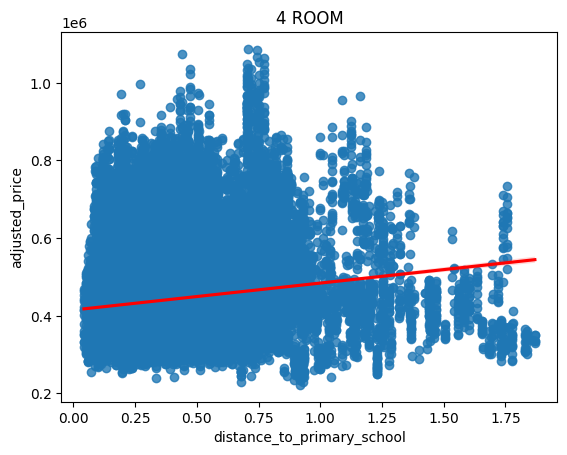

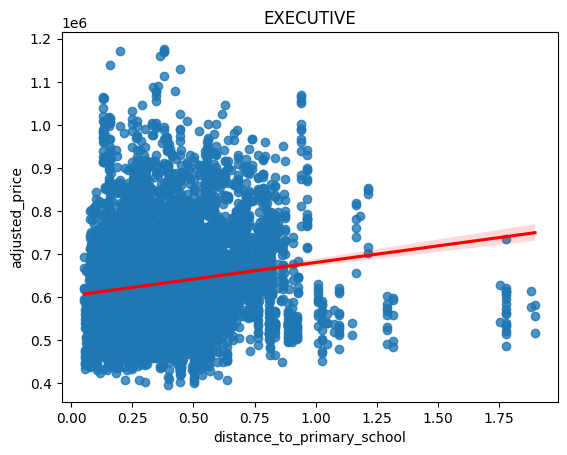

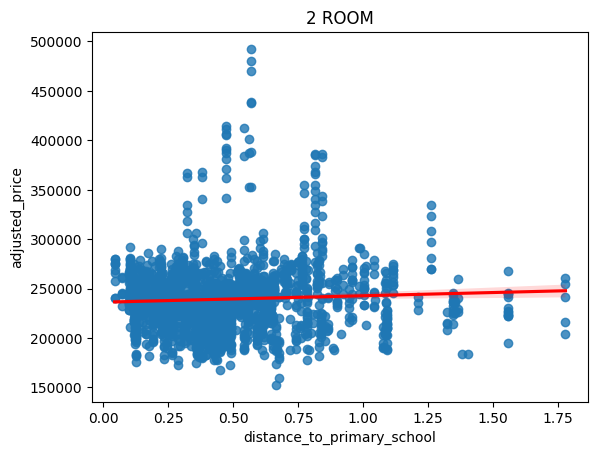

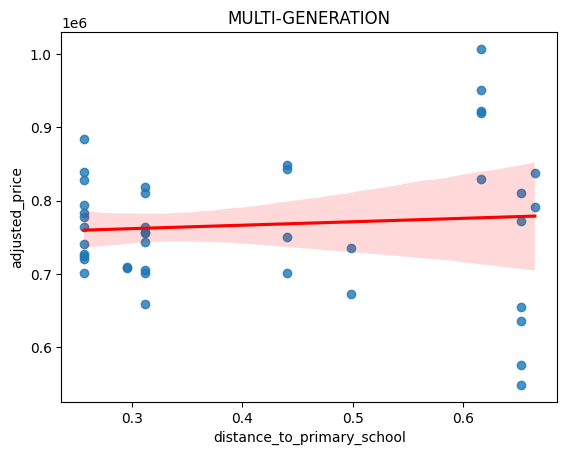

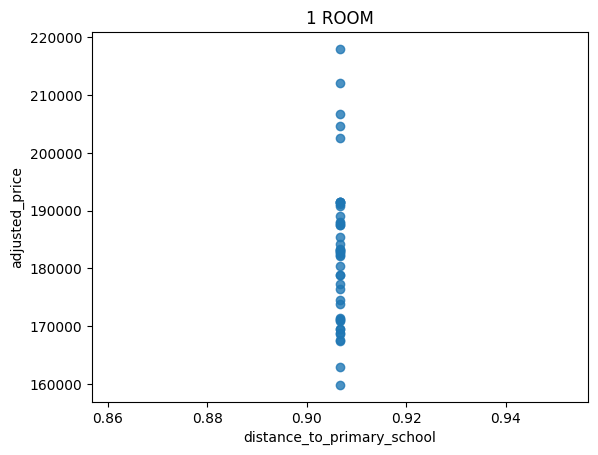

In [ ]:
flat_types = df_distance_to_pri_sch_plot['flat_type'].unique()


for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_pri_sch_plot[df_distance_to_pri_sch_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_primary_school',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.show()
  except KeyboardInterrupt:
    break

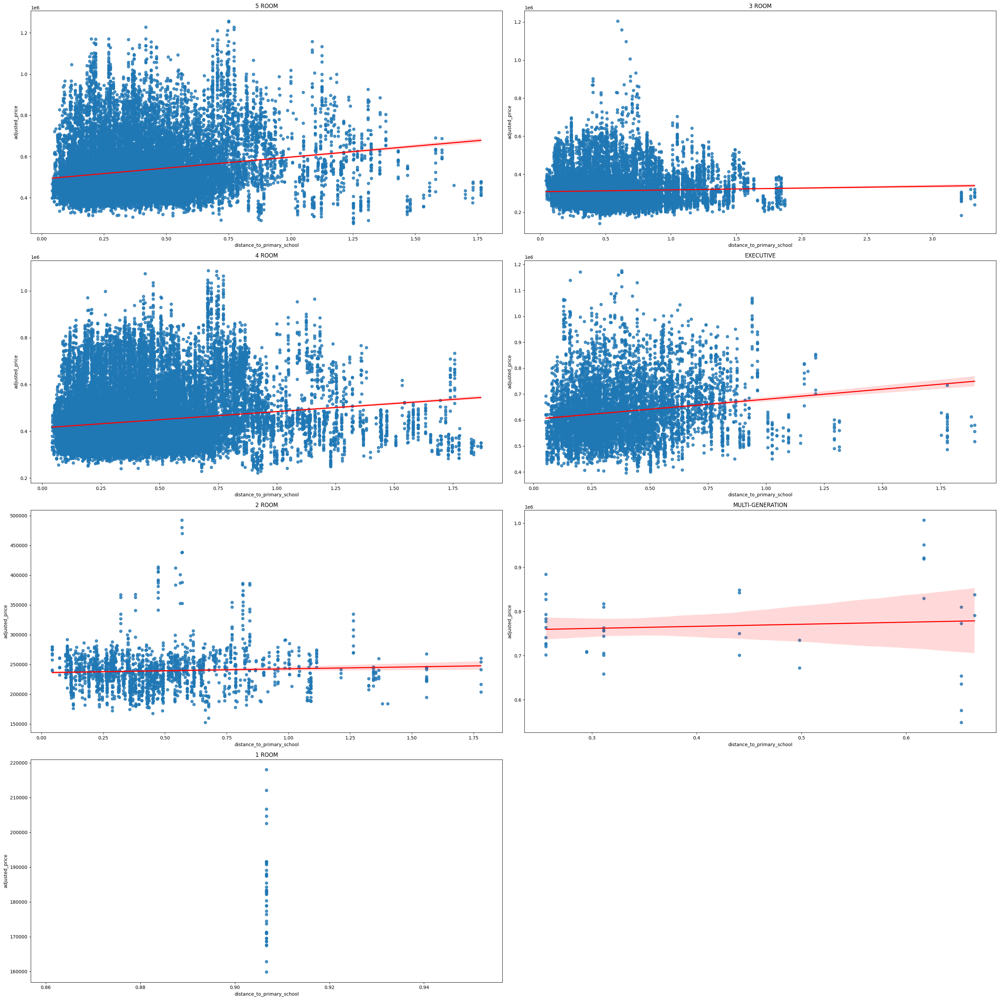

In [ ]:
flat_types = df_distance_to_pri_sch_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_pri_sch_plot[df_distance_to_pri_sch_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_primary_school',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

In [ ]:
df_distance_to_pri_sch_plot.groupby('flat_type').corr()

adjusted_price  \
flat_type                                                     
1 ROOM           adjusted_price                    1.000000   
                 distance_to_primary_school             NaN   
2 ROOM           adjusted_price                    1.000000   
                 distance_to_primary_school        0.054811   
3 ROOM           adjusted_price                    1.000000   
                 distance_to_primary_school        0.038560   
4 ROOM           adjusted_price                    1.000000   
                 distance_to_primary_school        0.151169   
5 ROOM           adjusted_price                    1.000000   
                 distance_to_primary_school        0.180826   
EXECUTIVE        adjusted_price                    1.000000   
                 distance_to_primary_school        0.152395   
MULTI-GENERATION adjusted_price                    1.000000   
                 distance_to_primary_school        0.082661   

                                             distance_to_primary_school  
flat_type                                                                
1 ROOM           adjusted_price                                     NaN  
                 distance_to_primary_school                         NaN  
2 ROOM           adjusted_price                                0.054811  
                 distance_to_primary_school                    1.000000  
3 ROOM           adjusted_price                                0.038560  
                 distance_to_primary_school                    1.000000  
4 ROOM           adjusted_price                                0.151169  
                 distance_to_primary_school                    1.000000  
5 ROOM           adjusted_price                                0.180826  
                 distance_to_primary_school                    1.000000  
EXECUTIVE        adjusted_price                                0.152395  
                 distance_to_primary_school                    1.000000  
MULTI-GENERATION adjusted_price                                0.082661  
                 distance_to_primary_school                    1.000000

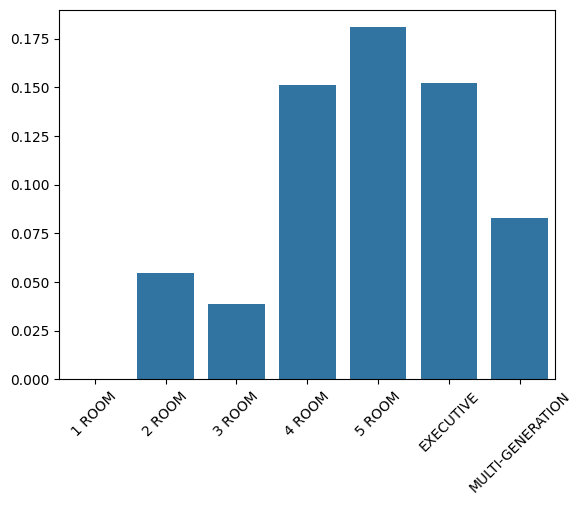

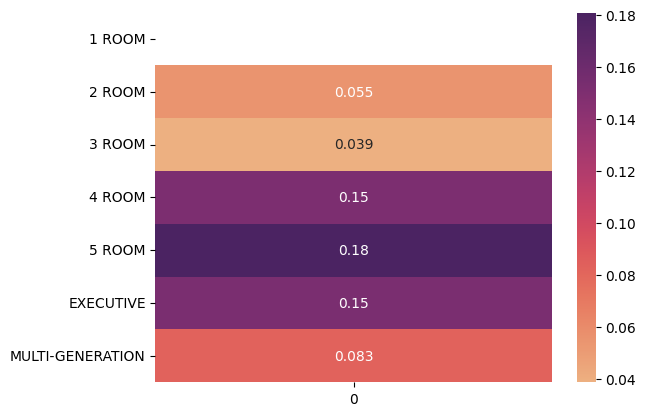

In [ ]:
bar_chart_data = []
xticks_xlabels = []
corr_matrix = df_distance_to_pri_sch_plot.groupby('flat_type').corr()
for i in range(len(flat_types)):
  corr_val = corr_matrix.iloc[2 * i].iloc[1]
  bar_chart_data.append(corr_val)
  xticks_xlabels.append(corr_matrix.index[2 * i][0])
fig = sns.barplot(bar_chart_data)
fig.xaxis.set_ticks(ticks = fig.get_xticks(), labels = xticks_xlabels, rotation = 45)
plt.show()
# plot heatmap
fig = sns.heatmap(np.expand_dims(np.array(bar_chart_data), axis = 1), cmap = 'flare', annot = True)
fig.yaxis.set_ticks(ticks = fig.get_yticks(), labels = xticks_xlabels, rotation = 0)
plt.show()

<b>For 5 room and 4 room, the adjusted price is more positively correlated with distance to primary school. This is opposite of what we are expecting that a shorter distance to primary school leads to more higher adjusted price. The splitting also shows that together with flat_type, the distance_to_primary_schools may be more helpful</b>

## EDA Distance to Secondary School

In [ ]:
df_distance_to_sec_sch = df[['adjusted_price', 'distance_to_secondary_school']]

<Axes: xlabel='distance_to_secondary_school', ylabel='Count'>

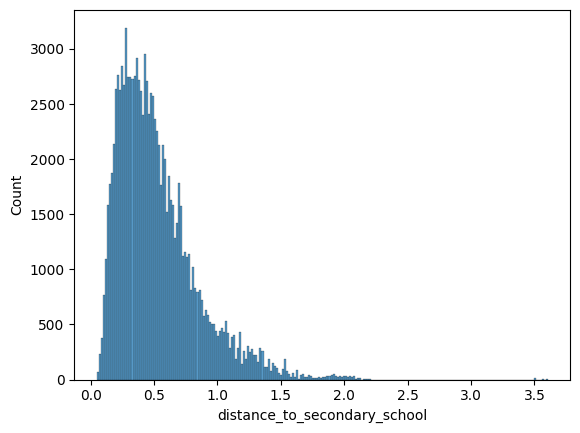

In [ ]:
sns.histplot(df_distance_to_sec_sch['distance_to_secondary_school'])

<Axes: xlabel='distance_to_secondary_school', ylabel='Count'>

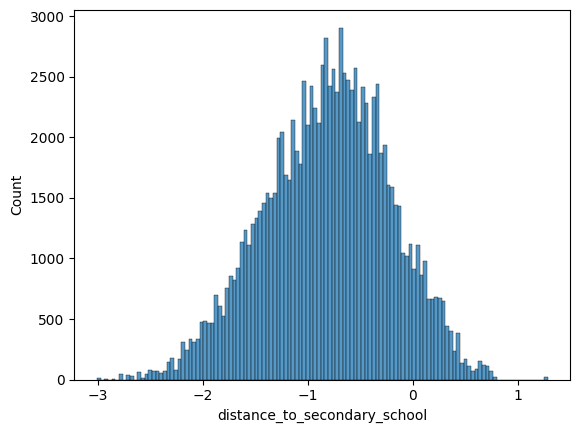

In [ ]:
sns.histplot(np.log(df_distance_to_sec_sch['distance_to_secondary_school']))

<b> There is positive skew for the distribution for distance_to_secondary_school. A log transform helps to reduce that skew.

<Axes: xlabel='distance_to_secondary_school', ylabel='adjusted_price'>

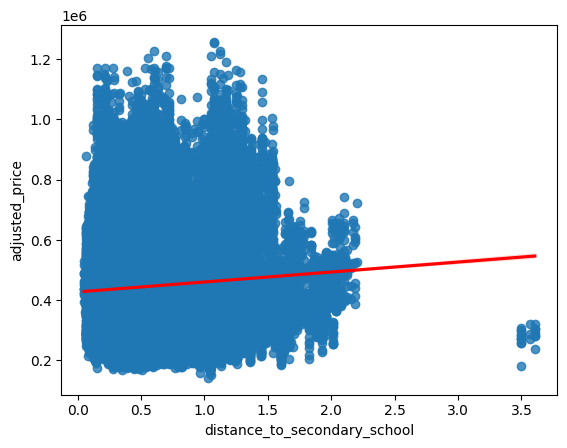

In [ ]:
sns.regplot(data = df_distance_to_sec_sch, x = 'distance_to_secondary_school', y = 'adjusted_price', line_kws = {'color': 'red'})

<Axes: >

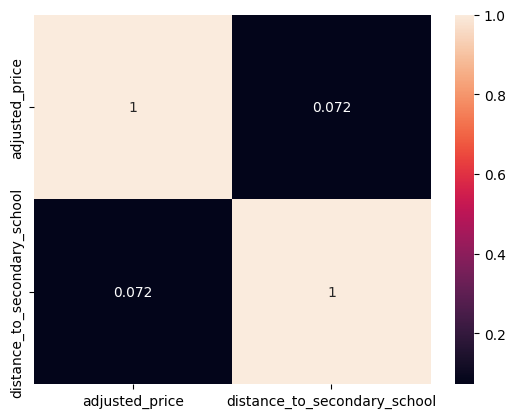

In [ ]:
sns.heatmap(df_distance_to_sec_sch.corr(), annot = True)

<Axes: >

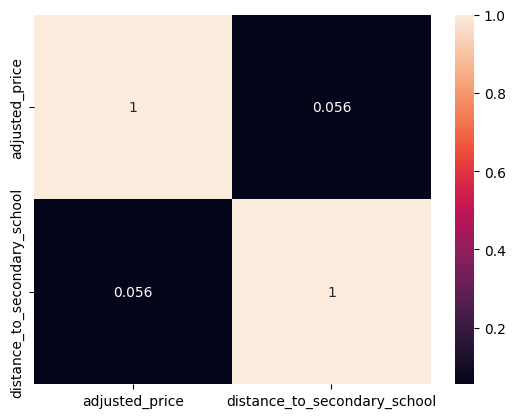

In [ ]:
df_sec_log_price = df_distance_to_sec_sch.copy()
df_sec_log_price['adjusted_price'] = df_sec_log_price['adjusted_price'].apply(np.log)
sns.heatmap(df_sec_log_price.corr(), annot = True)

<b> There is a weak positive correlation to adjusted_price. This is worsened when correlation is against log adjusted_price

In [ ]:
df_distance_to_sec_sch_plot = df[['adjusted_price', 'distance_to_secondary_school', 'flat_type']]

<Axes: xlabel='distance_to_secondary_school', ylabel='adjusted_price'>

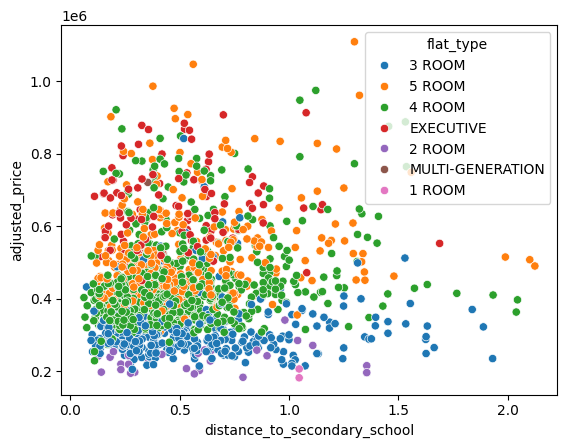

In [ ]:
sns.scatterplot(data = df_distance_to_sec_sch_plot.sample(1500), x = 'distance_to_secondary_school', y = 'adjusted_price', hue = 'flat_type')

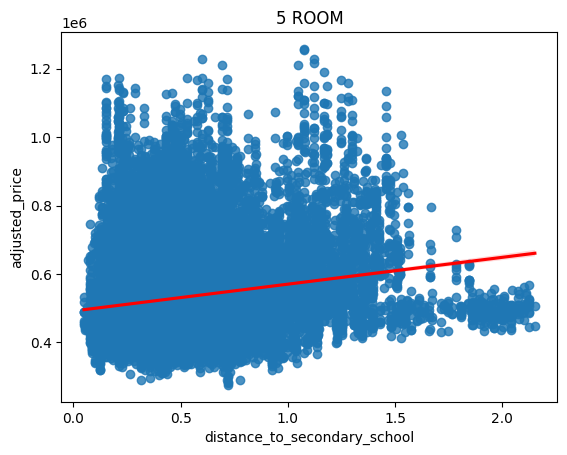

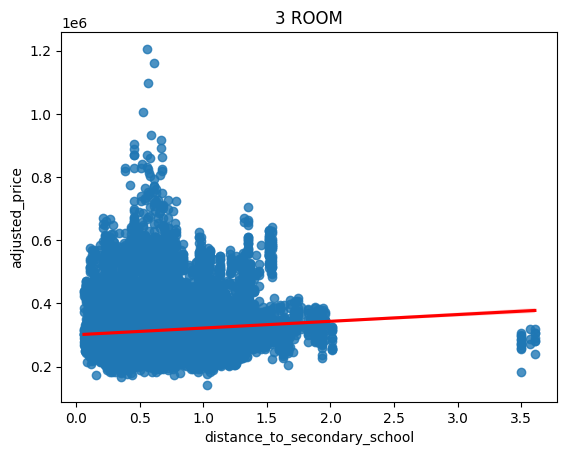

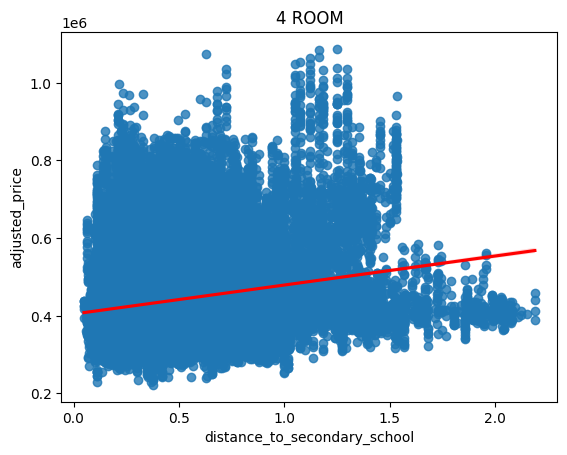

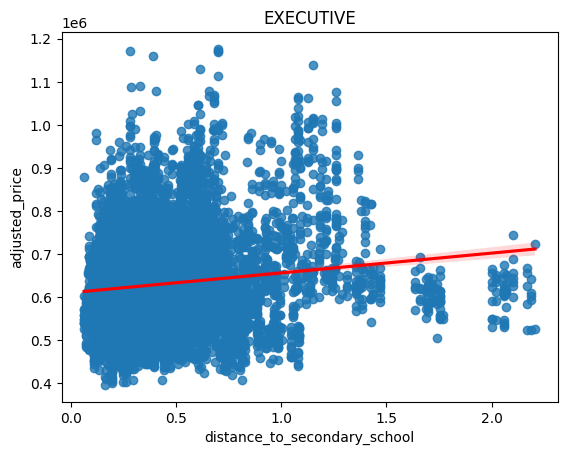

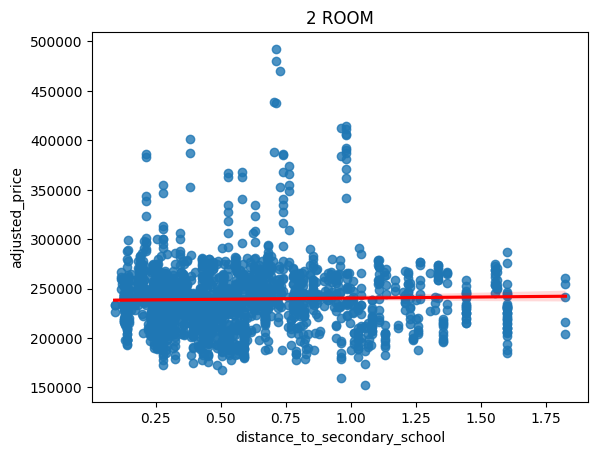

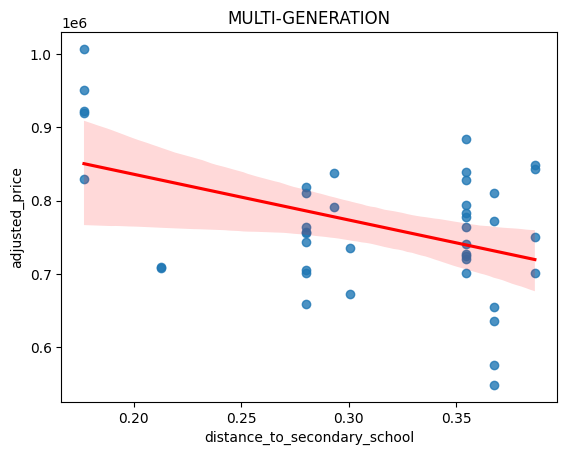

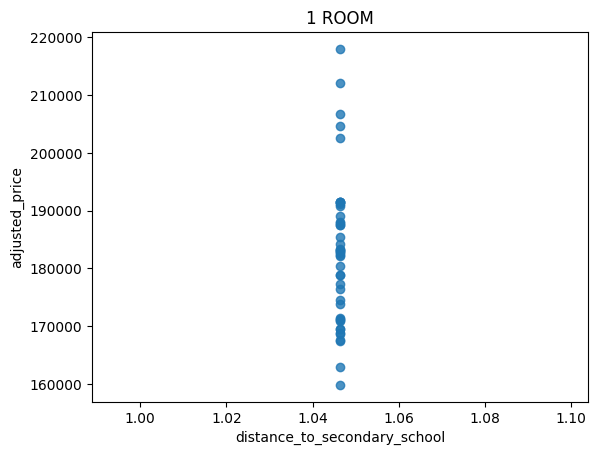

In [ ]:
flat_types = df_distance_to_sec_sch_plot['flat_type'].unique()


for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_sec_sch_plot[df_distance_to_sec_sch_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_secondary_school',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.show()
  except KeyboardInterrupt:
    break

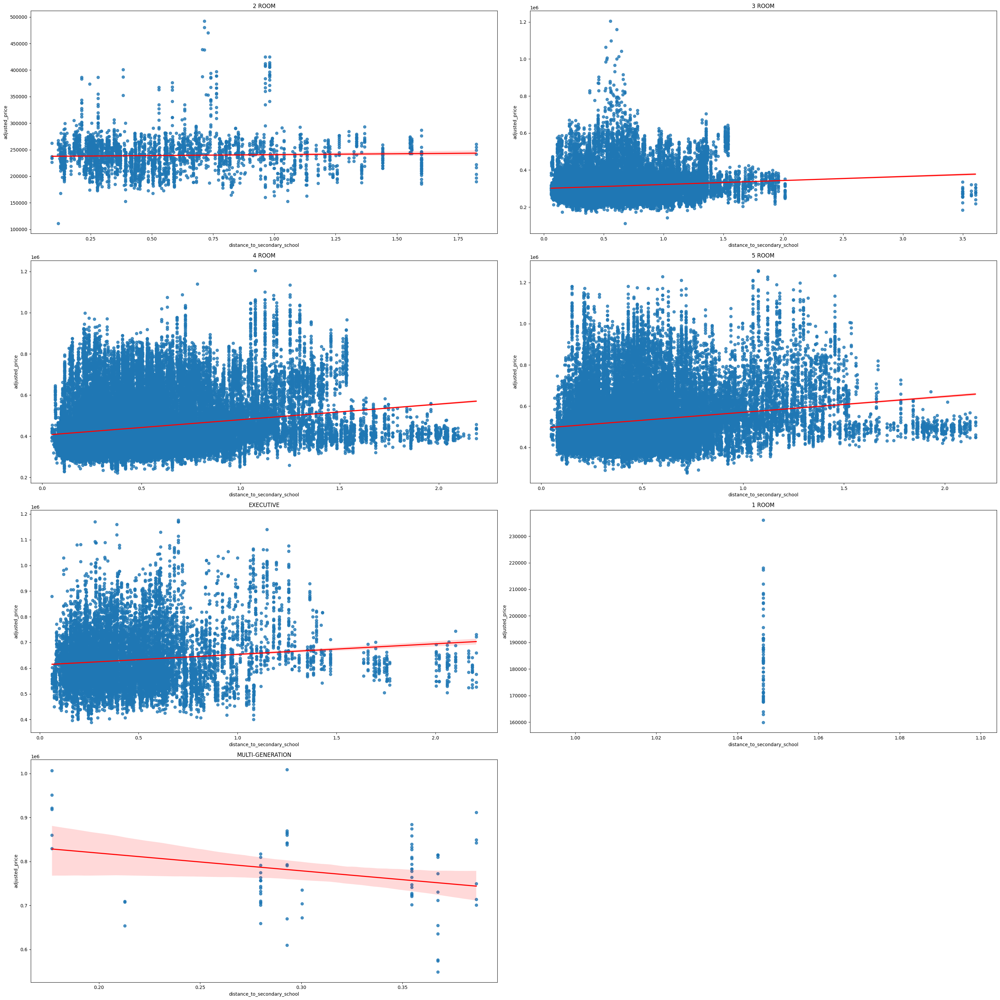

In [ ]:
flat_types = df_distance_to_sec_sch_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_sec_sch_plot[df_distance_to_sec_sch_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_secondary_school',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

In [ ]:
df_distance_to_sec_sch_plot.groupby('flat_type').corr()

adjusted_price  \
flat_type                                                       
1 ROOM           adjusted_price                      1.000000   
                 distance_to_secondary_school             NaN   
2 ROOM           adjusted_price                      1.000000   
                 distance_to_secondary_school        0.024172   
3 ROOM           adjusted_price                      1.000000   
                 distance_to_secondary_school        0.101086   
4 ROOM           adjusted_price                      1.000000   
                 distance_to_secondary_school        0.205598   
5 ROOM           adjusted_price                      1.000000   
                 distance_to_secondary_school        0.180991   
EXECUTIVE        adjusted_price                      1.000000   
                 distance_to_secondary_school        0.127668   
MULTI-GENERATION adjusted_price                      1.000000   
                 distance_to_secondary_school       -0.447112   

                                               distance_to_secondary_school  
flat_type                                                                    
1 ROOM           adjusted_price                                         NaN  
                 distance_to_secondary_school                           NaN  
2 ROOM           adjusted_price                                    0.024172  
                 distance_to_secondary_school                      1.000000  
3 ROOM           adjusted_price                                    0.101086  
                 distance_to_secondary_school                      1.000000  
4 ROOM           adjusted_price                                    0.205598  
                 distance_to_secondary_school                      1.000000  
5 ROOM           adjusted_price                                    0.180991  
                 distance_to_secondary_school                      1.000000  
EXECUTIVE        adjusted_price                                    0.127668  
                 distance_to_secondary_school                      1.000000  
MULTI-GENERATION adjusted_price                                   -0.447112  
                 distance_to_secondary_school                      1.000000

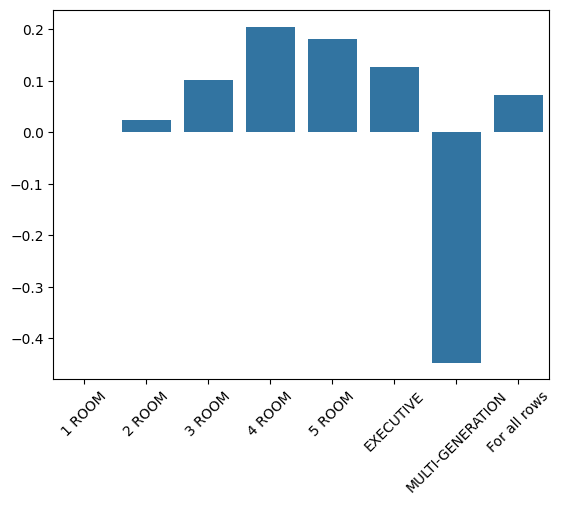

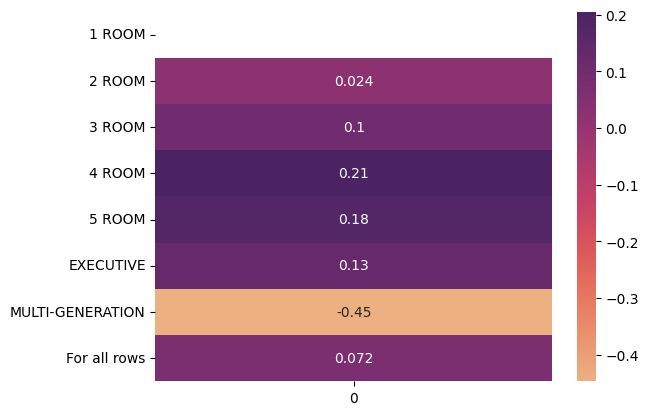

In [ ]:
bar_chart_data = []
xticks_xlabels = []
corr_matrix = df_distance_to_sec_sch_plot.groupby('flat_type').corr()
for i in range(len(flat_types)):
  corr_val = corr_matrix.iloc[2 * i].iloc[1]
  bar_chart_data.append(corr_val)
  xticks_xlabels.append(corr_matrix.index[2 * i][0])
bar_chart_data.append(df_distance_to_sec_sch_plot[['adjusted_price', 'distance_to_secondary_school']].corr().iloc[0].iloc[1])
xticks_xlabels.append('For all rows')
fig = sns.barplot(bar_chart_data)
fig.xaxis.set_ticks(ticks = fig.get_xticks(), labels = xticks_xlabels, rotation = 45)
plt.show()
# plot heatmap
fig = sns.heatmap(np.expand_dims(np.array(bar_chart_data), axis = 1), cmap = 'flare', annot = True)
fig.yaxis.set_ticks(ticks = fig.get_yticks(), labels = xticks_xlabels, rotation = 0)
plt.show()

<b> Correlation is generally higher fo 4 Room and 5 Room. This might suggest a greater importance of secondary schools to buyers of such flats

## EDA Distance to Junior College

In [ ]:
df_distance_to_jc = df[['adjusted_price', 'distance_to_junior_college']]

<Axes: ylabel='Count'>

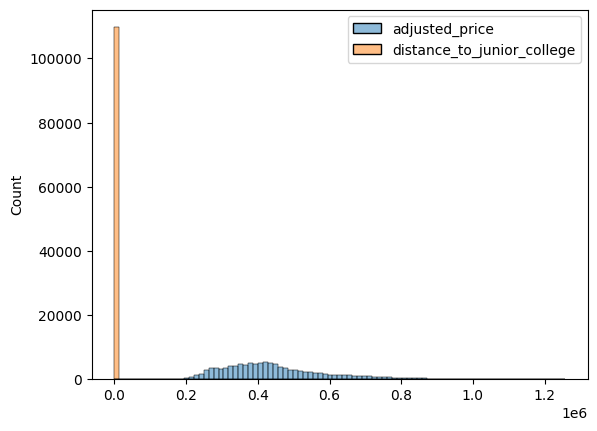

In [ ]:
sns.histplot(df_distance_to_jc)

<Axes: ylabel='Count'>

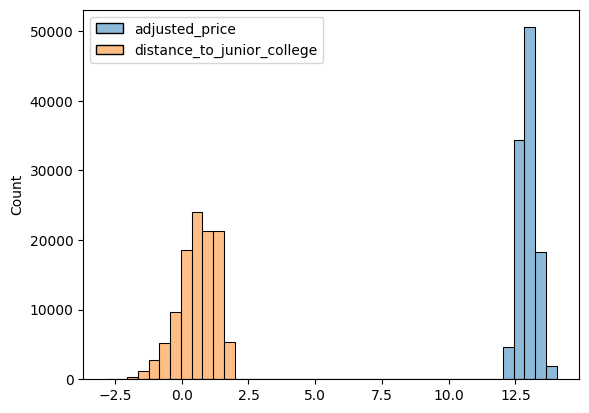

In [ ]:
sns.histplot(np.log(df_distance_to_jc))

<b> Distance to Junior Colleges has a unique distribution. This may also be attributed due to there being a few junior colleges.

<Axes: xlabel='distance_to_junior_college', ylabel='adjusted_price'>

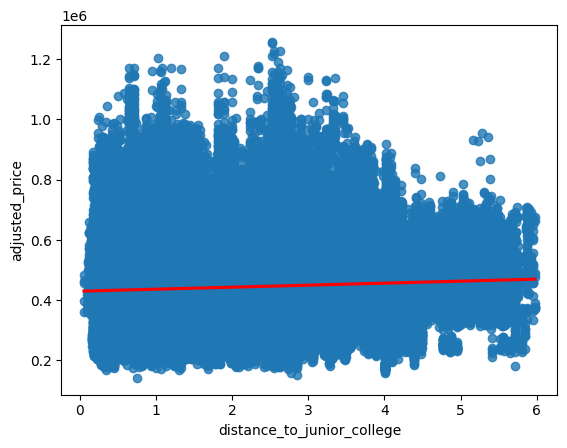

In [ ]:
sns.regplot(data = df_distance_to_jc, x = 'distance_to_junior_college', y = 'adjusted_price', line_kws = {'color': 'red'})

<Axes: >

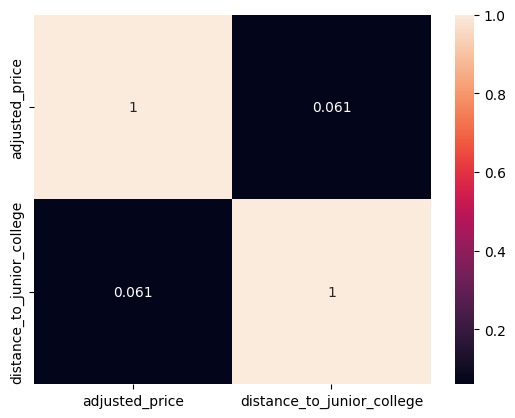

In [ ]:
sns.heatmap(df_distance_to_jc.corr(), annot = True)

<Axes: >

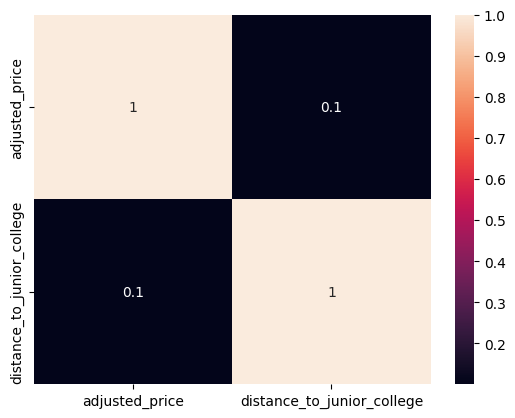

In [ ]:
df_jc_log_price = df_distance_to_jc.copy()
df_jc_log_price['adjusted_price'] = df_jc_log_price['adjusted_price'].apply(np.log)
sns.heatmap(df_jc_log_price.corr(), annot = True)

<b> There is weak correlation with adjusted_price. Correlation with log adjusted_price does increase. The positive correlation is not really expected with proximity to a junior college being expected to raise the value of resale flats

In [ ]:
df_distance_to_jc_plot = df[['adjusted_price', 'distance_to_junior_college', 'flat_type']]

<Axes: xlabel='distance_to_junior_college', ylabel='adjusted_price'>

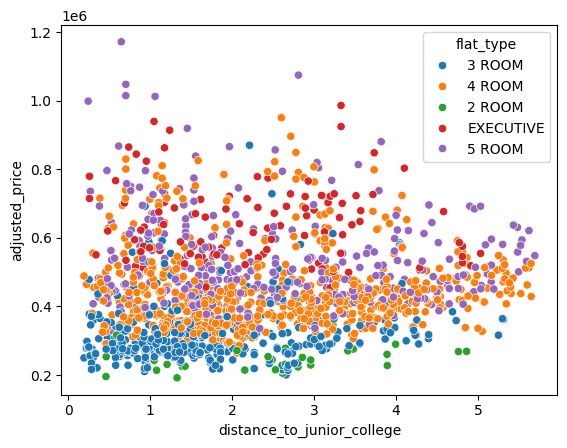

In [ ]:
sns.scatterplot(data = df_distance_to_jc_plot.sample(1500), x = 'distance_to_junior_college', y = 'adjusted_price', hue = 'flat_type')

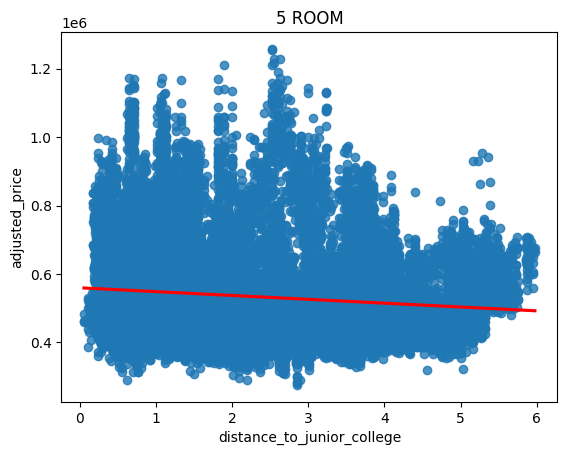

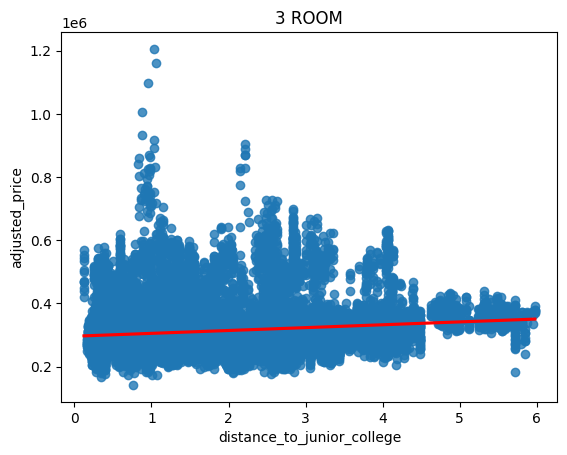

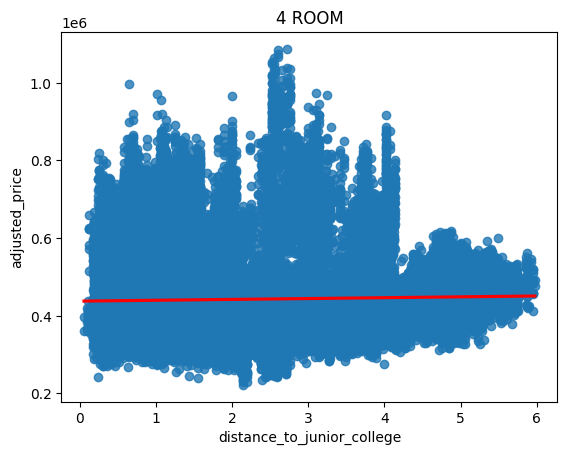

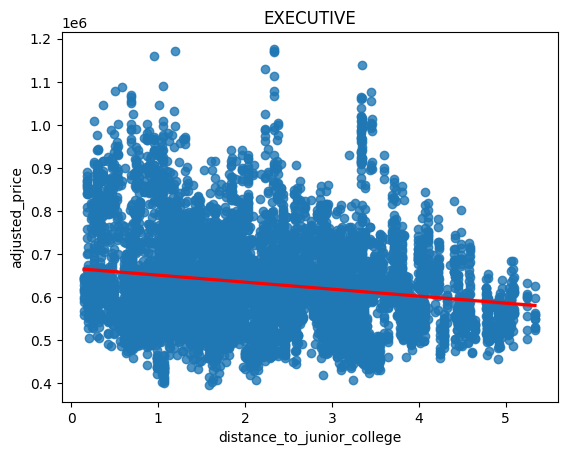

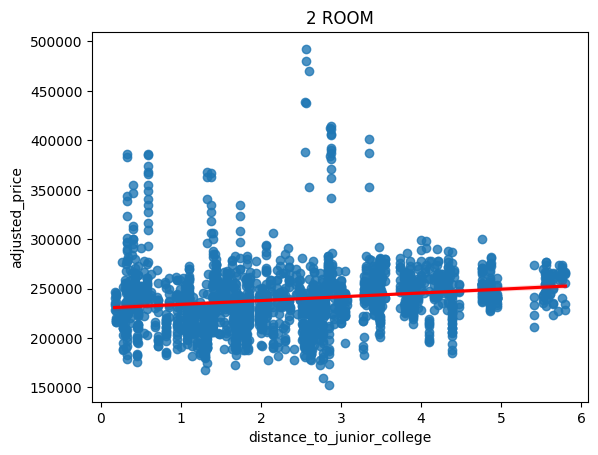

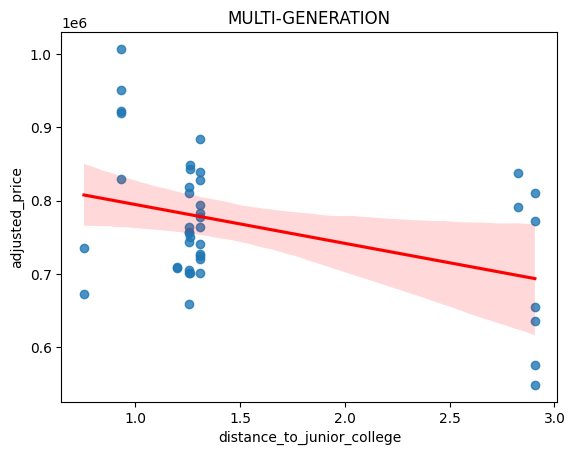

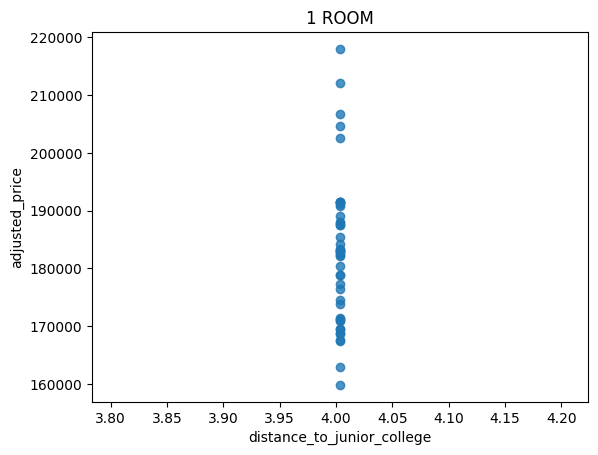

In [ ]:
flat_types = df_distance_to_jc_plot['flat_type'].unique()


for i in range(len(flat_types)):
  try:
    plt.figure()
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_jc_plot[df_distance_to_jc_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_junior_college',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
    plt.show()
  except KeyboardInterrupt:
    break

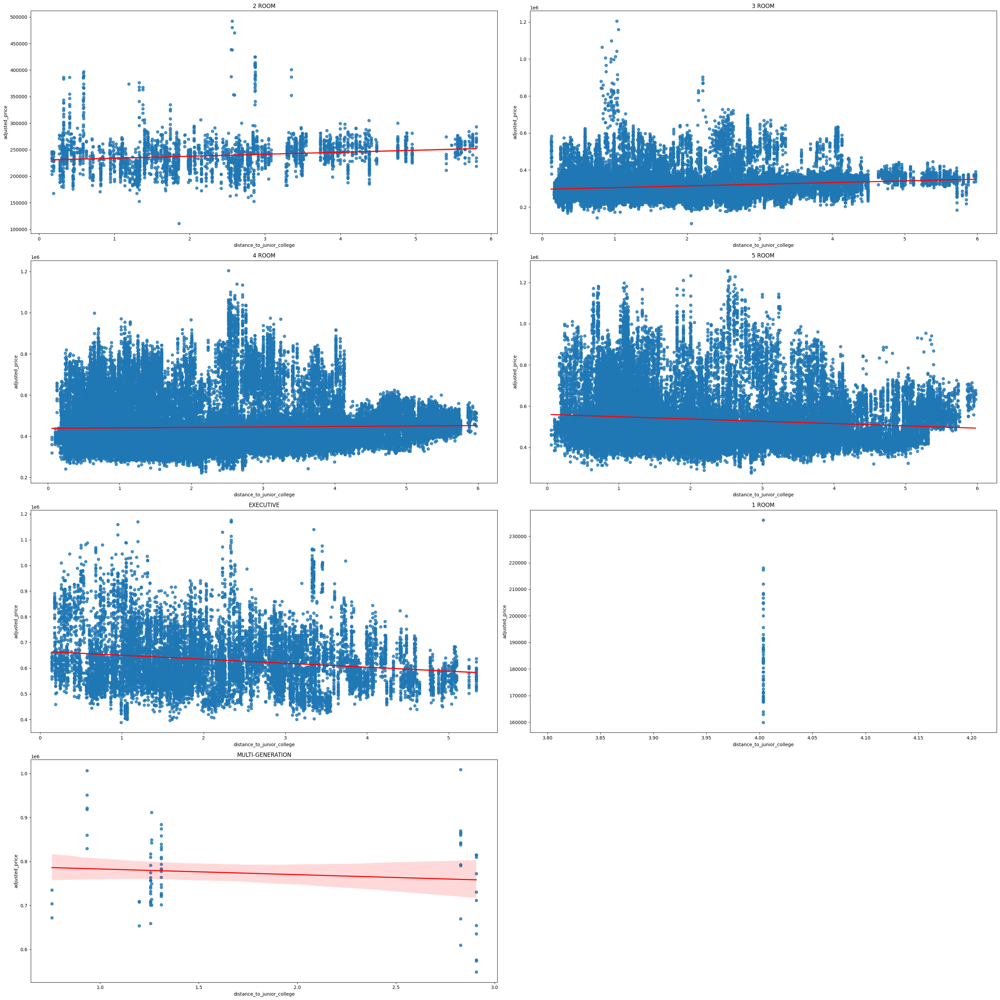

In [ ]:
flat_types = df_distance_to_jc_plot['flat_type'].unique()
columns = 2
rows = len(flat_types) // columns + len(flat_types) % columns

plt.figure(figsize = (30, 30))
for i in range(len(flat_types)):
  try:
    plt.subplot(rows, columns, i + 1)
    plt.title(label = flat_types[i])
    sns.regplot(
        data = df_distance_to_jc_plot[df_distance_to_jc_plot['flat_type'] == flat_types[i]],
        x = 'distance_to_junior_college',
        y = 'adjusted_price',
        line_kws = {'color': 'red'}
    )
  except KeyboardInterrupt:
    break
plt.tight_layout()
plt.show()

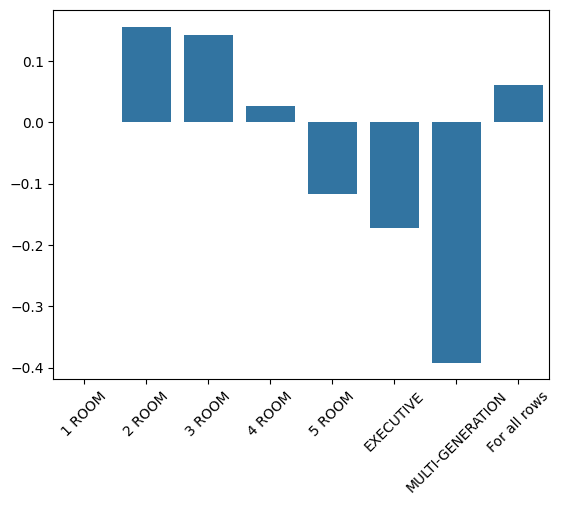

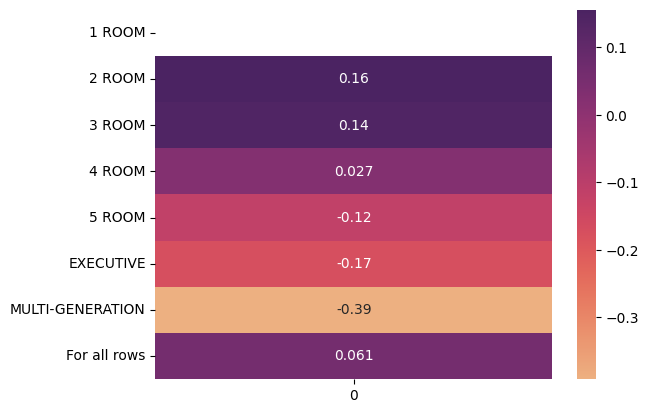

In [ ]:
bar_chart_data = []
xticks_xlabels = []
corr_matrix = df_distance_to_jc_plot.groupby('flat_type').corr()
for i in range(len(flat_types)):
  corr_val = corr_matrix.iloc[2 * i].iloc[1]
  bar_chart_data.append(corr_val)
  xticks_xlabels.append(corr_matrix.index[2 * i][0])
bar_chart_data.append(df_distance_to_jc_plot[['adjusted_price', 'distance_to_junior_college']].corr().iloc[0].iloc[1])
xticks_xlabels.append('For all rows')
fig = sns.barplot(bar_chart_data)
fig.xaxis.set_ticks(ticks = fig.get_xticks(), labels = xticks_xlabels, rotation = 45)
plt.show()
# plot heatmap
fig = sns.heatmap(np.expand_dims(np.array(bar_chart_data), axis = 1), cmap = 'flare', annot = True)
fig.yaxis.set_ticks(ticks = fig.get_yticks(), labels = xticks_xlabels, rotation = 0)
plt.show()

<b> For flat_types such as multi-generation, the correlation becomes negative in addition to a significant increase. This also applies to flat_types such as 5 Room and Executive. In general, "larger" and more premium flats have a negative and higher correlation. This might be helpful when fitting out model